In [81]:
# import time
import os
from skimage import io
import scipy as sp
import numpy as np
# import sys
import openpnm as op
import porespy as ps
import pandas as pd
import matplotlib.pyplot as plt 
from matplotlib import rcParams
np.set_printoptions(precision=4)
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
import math

In [82]:
print(op.__version__)

3.5.0


In [83]:
# Matplotlib plotting controls
plt.rc('axes', linewidth=2)
plt.rc('font', weight='bold')
params = {'figure.autolayout': True,
          'figure.titleweight': 'bold',
          'font.weight': 'bold',
          'font.size': 14,
          'font.family': 'sans-serif',
          'font.sans-serif': 'Arial',
          'legend.fontsize': 12,
#           'legend.title_fontsize':10,
          'figure.figsize': (6, 5),
          'figure.titlesize': 14,
          'axes.labelsize': 12,
          'axes.labelweight': 'bold',
          'axes.titlesize': 14,
          'axes.linewidth': 2,
          'xtick.labelsize': 12,
          'ytick.labelsize': 12,
          'xtick.direction': 'in',
          'ytick.direction': 'in',
          'xtick.top': True,
          'xtick.bottom': True,
          'xtick.labeltop': False,
          'xtick.labelbottom': True,
          'ytick.left': True,
          'ytick.right': True,
          'ytick.labelright': False,
          'ytick.labelleft': True,
          'ytick.major.size': 5.5,
          'ytick.major.width': 0.8,
          'xtick.major.size': 5.5,
          'xtick.major.width': 0.8,
          'ytick.minor.size': 3.5,
          'ytick.minor.width': 0.6,
          'xtick.minor.size': 3.5,
          'xtick.minor.width': 0.6,
        'xtick.minor.visible':True,
         'ytick.minor.visible':True}
rcParams.update(params)

# Step1: Read in files and prep work

In [84]:
#Read in all tif stacks

voxel_size = 6e-9

numSamples = 3
numRegions = 6

sampleNames = ['pris','uncomp','comp']
regionIndicators = list(range(1,numRegions+1))

im = []

path = 'data/1p2um volumes/'
for i,x in enumerate(sampleNames):
    im_temp = []
    for j,y in enumerate(regionIndicators):
        im_temp.append(io.imread(path+x+'_1p2um/'+x+'_1p2um_'+str(y)+'.tif'))
    im.append(im_temp)
        
#separate solid and void
im_solid = []
im_void = []

for i,x in enumerate(im):
    solid_temp = []
    void_temp = []
    for j, y in enumerate(x):
        solid_temp.append(y != 0)
        void_temp.append(y == 0)
    im_solid.append(solid_temp)
    im_void.append(void_temp)

im_solid = np.array(im_solid)
im_void = np.array(im_void)

im_total = [im_solid, im_void]
im_total = np.array(im_total)

#check
print('im_solid array shape:', im_solid.shape)
print('im_void array shape:',im_void.shape)
print()
print('im_total array shape:',im_total.shape)

im_solid array shape: (3, 6, 200, 200, 200)
im_void array shape: (3, 6, 200, 200, 200)

im_total array shape: (2, 3, 6, 200, 200, 200)


In [85]:
#Run Snow algorithm for pore network extraction 
#https://porespy.org/modules/generated/generated/porespy.networks.snow2.html#porespy.networks.snow2


# snow_solid = []
# for x in (im_solid):
#     snow_temp = []
#     for y in x:
#         snow_temp.append(ps.networks.snow2(y, accuracy='standard', voxel_size=voxel_size))
#     snow_solid.append(snow_temp)
    
# snow_void = []
# for x in (im_void):
#     snow_temp = []
#     for y in x:
#         snow_temp.append(ps.networks.snow2(y, accuracy='standard', voxel_size=voxel_size))
#     snow_void.append(snow_temp)



In [ ]:
#Store the snow network extractions to save computational time if notebook restarts
# %store snow_solid
# %store snow_void

Stored 'snow_solid' (list)
Stored 'snow_void' (list)


In [86]:
#Restore the snow network extractions if needed
%store -r snow_solid
%store -r snow_void

### Come here to re-initialize project object if you ran phases models (O2, H2O) multiple times. Error of : "Another object is already named O2"

In [87]:
#Create OpenPNM project objects
pn_solid = []
pn_void = []

for x in snow_solid:
    pn_temp = []
    for y in x:
        pn_temp.append(op.io.network_from_porespy(y.network))
    pn_solid.append(pn_temp)
    
for x in snow_void:
    pn_temp = []
    for y in x:
        pn_temp.append(op.io.network_from_porespy(y.network))
    pn_void.append(pn_temp)
    

pn_total = [pn_solid, pn_void]



In [1]:
for phase in pn_total:
    for sample in phase:
        for region in sample:
            region.add_model_collection(op.models.collections.geometry.spheres_and_cylinders)
            region.regenerate_models()
            h = op.utils.check_network_health(region)
            # print(h)

            op.topotools.trim(network=region, pores=h['disconnected_pores'])
            h = op.utils.check_network_health(region)
            # print(h)


NameError: name 'pn_total' is not defined

# Step 2: Formation Factor, Kf

In [90]:
#Formation factor, using porespy tortuosity.fd()

#Direction names that correspond to OpenPNM's x, y, and z
#x and z are switched from taufactor, y is still through-plane
directionNames = ['In-plane depth','Through-plane','In-plane width']
directions = [['xmin','xmax'],['ymin','ymax'],['zmin','zmax']]


tort_sims = []
for b,bin in enumerate(im_total):
    bin_temp = []

    for s,sample in enumerate(bin):
        sample_temp = []

        for r,region in enumerate(sample):
            region_temp = []

            for d, direction in enumerate(directions):
                dir_temp = ps.simulations.tortuosity_fd(region,d)
                
                region_temp.append(dir_temp)
            sample_temp.append(region_temp)
        bin_temp.append(sample_temp)
    tort_sims.append(bin_temp)

[11:28:16] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=343454;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=306673;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:29:05] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=753255;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=778559;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:29:51] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=728713;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=424724;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:30:33] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=407633;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=998285;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:31:14] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=186922;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=68746;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:31:55] ERROR    Inlet/outlet rates don't match: 4.7096e+01 vs. -4.7091e+01                          ]8;id=42953;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=955995;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=766435;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=605152;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:32:35] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=425323;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=950614;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:33:20] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=888300;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=466255;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:34:03] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=260332;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=304763;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:35:05] ERROR    Inlet/outlet rates don't match: 4.3210e+01 vs. -4.3205e+01                          ]8;id=406417;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=115428;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:35:06] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=516103;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=673244;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:36:06] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=502876;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=766391;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:36:57] ERROR    Inlet/outlet rates don't match: 3.3574e+01 vs. -3.3568e+01                          ]8;id=627340;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=777424;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:36:58] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=637988;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=480565;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:38:13] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=651289;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=40559;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:39:22] ERROR    Inlet/outlet rates don't match: 4.2206e+01 vs. -4.2199e+01                          ]8;id=887244;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=33421;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:39:23] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=619228;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=196219;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:40:33] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=724026;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=224731;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:41:44] ERROR    Inlet/outlet rates don't match: 3.9839e+01 vs. -3.9833e+01                          ]8;id=481999;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=698078;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=22464;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=687131;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:42:39] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=892785;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=194348;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:43:24] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=337005;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=384723;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:44:07] ERROR    Inlet/outlet rates don't match: 4.4142e+01 vs. -4.4137e+01                          ]8;id=400444;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=57019;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=390643;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=353342;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:44:45] ERROR    Inlet/outlet rates don't match: 4.4417e+01 vs. -4.4412e+01                          ]8;id=774136;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=532744;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=460085;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=990774;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:45:26] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=278841;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=463200;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:46:08] ERROR    Inlet/outlet rates don't match: 3.7566e+01 vs. -3.7562e+01                          ]8;id=958482;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=673636;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=207066;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=910567;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:46:49] ERROR    Inlet/outlet rates don't match: 3.2200e+01 vs. -3.2196e+01                          ]8;id=273169;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=431330;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:46:50] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=512916;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=781101;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:47:34] ERROR    Inlet/outlet rates don't match: 3.6405e+01 vs. -3.6399e+01                          ]8;id=8693;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=516384;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=63004;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=863963;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:48:16] ERROR    Inlet/outlet rates don't match: 2.7416e+01 vs. -2.7413e+01                          ]8;id=586675;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=879869;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=618437;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=681051;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:48:52] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=238071;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=421320;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:49:30] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=838834;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=658508;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:50:12] ERROR    Inlet/outlet rates don't match: 3.1560e+01 vs. -3.1556e+01                          ]8;id=915409;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=207301;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=872018;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=615240;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:51:01] ERROR    Inlet/outlet rates don't match: 3.8663e+01 vs. -3.8656e+01                          ]8;id=383038;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=667033;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=993304;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=561990;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:51:44] ERROR    Inlet/outlet rates don't match: 4.1004e+01 vs. -4.0999e+01                          ]8;id=603048;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=301058;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:51:45] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=985220;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=973798;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:52:34] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=15831;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=174737;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:53:11] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=666089;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=683794;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:53:47] ERROR    Inlet/outlet rates don't match: 3.3238e+01 vs. -3.3234e+01                          ]8;id=970774;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=440362;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:53:48] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=432259;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=968062;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:54:29] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=741297;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=955443;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:55:13] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=155567;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=565123;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:56:00] ERROR    Inlet/outlet rates don't match: 4.3288e+01 vs. -4.3283e+01                          ]8;id=803218;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=815658;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:56:01] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=896311;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=252413;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:56:51] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=983985;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=911778;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:57:48] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=114271;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=923941;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:58:40] ERROR    Inlet/outlet rates don't match: 6.6837e+01 vs. -6.6829e+01                          ]8;id=607060;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=735912;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

[11:58:41] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=253748;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=25751;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[11:59:39] ERROR    Inlet/outlet rates don't match: 6.7378e+01 vs. -6.7371e+01                          ]8;id=756686;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=505774;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=692660;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=967987;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[12:00:31] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=330858;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=98538;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[12:01:26] ERROR    Inlet/outlet rates don't match: 5.9940e+01 vs. -5.9933e+01                          ]8;id=311407;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=601326;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#107\107]8;;\

           WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=458642;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=509990;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

[12:02:14] WARNING  Found non-percolating regions, were filled to percolate                              ]8;id=550462;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py\_dns.py]8;;\:]8;id=699587;file:///Users/karaferner/opt/anaconda3/envs/tspt-props-mod-py311/lib/python3.11/site-packages/porespy/simulations/_dns.py#74\74]8;;\

: 

In [72]:
#Formation factor, using ohmic conduction algorithm 
totVol = []
kf = []
oc = []
#Direction names that correspond to OpenPNM's x, y, and z
#x and z are switched from taufactor, y is still through-plane
directionNames = ['In-plane depth','Through-plane','In-plane width']
directions = [['xmin','xmax'],['ymin','ymax'],['zmin','zmax']]

for p,phase in enumerate(pn_total):
    phase_totVol_temp = []
    phase_kf_temp = []
    oc_phase = []

    for s,sample in enumerate(phase):
        sample_totVol_temp = []
        sample_kf_temp = []
        oc_sample = []

        for r,region in enumerate(sample):

            #create generic phase
            phase_generic = op.phase.Phase(network=region)
            phase_generic['pore.electrical_conductivity'] = 1
            phase_generic['throat.electrical_conductivity'] = 1


            #create generic physics
            # physics_generic = op.physics.Standard(network=region,  phase=phase_generic, geometry=geo[p][s][r])
            # print(physics_generic)

            region['throat.electrical_conductance'] = op.models.physics.electrical_conductance.generic_electrical(phase=phase_generic)
            
            
            pore_volumes = np.sum(region['pore.volume'])
            throat_volumes = np.sum(region['throat.volume'])
            totV = pore_volumes + throat_volumes
            sample_totVol_temp.append(totV)
            
            
            direction_kf_temp = []
            #iterate through all 3 directions, x y and z
            for d in range(3):

                #label inlet, outlet
                inlets = region.pores(labels=directions[d][1])
                outlets = region.pores(labels=directions[d][0])

                # ohmic conduction algorithm
                oc_i = op.algorithms.OhmicConduction(network=region, phase=phase_generic)
                oc_i.settings['conductance'] = 'throat.electrical_conductance'


                # Dirichlet BCs: inlet= 1 V, outlet = 0 V
                vL, vR = 1.0, 0.0
                oc_i.set_value_BC(pores=inlets,values=vL)
                oc_i.set_value_BC(pores=outlets, values=vR)

                #run ohmic conduction
                oc_i.run()
                if d==1:
                    oc_sample.append(oc_i)

                    #plot
                    # fig, ax = plt.subplots(figsize=[6, 6])
                    # op.visualization.plot_coordinates(ax=ax,
                    #                         network=region,
                    #                         size_by=region["pore.diameter"],
                    #                         color_by=oc_i["pore.voltage"],
                    #                         markersize=25)
                    # plt.axis('on')
                    # plt.show()

                #L = length between inlet and outlet faces
                L = im_total[p][s][r].shape[d]*voxel_size

                # area of inlet (and outlet)
                A = (im_total[p][s][r].shape[(d+1)%3]*voxel_size)*(im_total[p][s][r].shape[(d+2)%3]*voxel_size)

                sigma_eff = np.sum(oc_i.rate(pores=inlets))*L/(A*(vL-vR))
                    
                    # inlets=inlets, outlets=outlets,
                    #                                 domain_area=A, domain_length=L)[0]
                print(sigma_eff)

                direction_kf_temp.append(sigma_eff)
            sample_kf_temp.append(direction_kf_temp)
        oc_phase.append(oc_sample)
        phase_kf_temp.append(sample_kf_temp)
        phase_totVol_temp.append(sample_totVol_temp)
    kf.append(phase_kf_temp)
    totVol.append(phase_totVol_temp)
    oc.append(oc_phase)
    

    

0.010960612248221303
0.01046830543608794
0.00986724677782466
0.011111268031115007
0.010828274459073296
0.010060434441019363
0.00999513881660894
0.010661119363771997
0.009234177756835852
0.008422804879740503
0.006401224600042285
0.007169405323943529
0.007536077635716107
0.009604426896756557
0.008988482693847354
0.011592175967573743
0.010858422354274597
0.010057520317875096
0.00837319318283461
0.008314877072470809
0.007773276319691962
0.006023022390916144
0.007360403407446655
0.00556440682203009
0.006862006193651618
0.008593076329033144
0.0071997698656721286
0.00892938345488339
0.008787665696849918
0.008023577459145568
0.008507383729666173
0.007502137637294847
0.00835937962670533
0.009078367982961308
0.010601368101819308
0.009276900405261261
0.01392390098702216
0.012943499359377306
0.012340487350136344
0.01397139624806829
0.01329119619230448
0.012107159686366746
0.013385498148418945
0.01512968741996284
0.01044226162871374
0.010987252596015613
0.011614414689112904
0.010239438121448908
0.0

In [51]:
#calculate both phase volume fractions using the pore network 

volFrac = []
for p,phase in enumerate(totVol):
    phase_volFrac_temp = []
    for s,sample in enumerate(phase):
        sample_volFrac_temp = []
        for r,region in enumerate(sample):
            sample_volFrac_temp.append(region/(region+totVol[(p+1)%2][s][r]))
        phase_volFrac_temp.append(sample_volFrac_temp)
    volFrac.append(phase_volFrac_temp)

volFrac = np.array(volFrac)
print(volFrac)

[[[0.4896 0.4911 0.4688 0.4481 0.4478 0.4927]
  [0.4376 0.3674 0.3824 0.4355 0.4463 0.4641]
  [0.663  0.6101 0.6234 0.604  0.618  0.634 ]]

 [[0.5104 0.5089 0.5312 0.5519 0.5522 0.5073]
  [0.5624 0.6326 0.6176 0.5645 0.5537 0.5359]
  [0.337  0.3899 0.3766 0.396  0.382  0.366 ]]]


In [52]:
#calculate average and std of volume fraction and formation factor data

avg_volFrac = []
avg_kf = []

std_volFrac = []
std_kf = []


for p,phase in enumerate(volFrac):
    phase_aVF_temp = []
    phase_akf_temp = []
    phase_stdVF_temp = []
    phase_stdkf_temp = []
    for s,sample in enumerate(phase):
        phase_aVF_temp.append(np.average(sample))
        phase_stdVF_temp.append(np.std(sample))
        
        #For formation factor, average each direction across regions
        phase_akf_temp.append(np.average(kf[p][s], axis=0))
        phase_stdkf_temp.append(np.std(kf[p][s], axis=0))

    avg_volFrac.append(phase_aVF_temp)
    avg_kf.append(phase_akf_temp)
    std_volFrac.append(phase_stdVF_temp)
    std_kf.append(phase_stdkf_temp)
    
avg_volFrac = np.array(avg_volFrac)
avg_kf = np.array(avg_kf)

std_volFrac = np.array(std_volFrac)
std_kf = np.array(std_kf)

print('Avg VF: \n', avg_volFrac)
print()
print('Avg kf: \n', avg_kf)
print()
print('Std VF: \n', std_volFrac)
print()
print('Std kf: \n', std_kf)



Avg VF: 
 [[0.473  0.4222 0.6254]
 [0.527  0.5778 0.3746]]

Avg kf: 
 [[[[0.0099]
   [0.0098]
   [0.0092]]

  [[0.008 ]
   [0.0085]
   [0.0077]]

  [[0.0136]
   [0.0131]
   [0.0117]]]


 [[[0.0105]
   [0.0108]
   [0.011 ]]

  [[0.0094]
   [0.0099]
   [0.01  ]]

  [[0.0071]
   [0.0078]
   [0.0073]]]]

Std VF: 
 [[0.0194 0.035  0.0193]
 [0.0194 0.035  0.0193]]

Std kf: 
 [[[[0.0015]
   [0.0016]
   [0.001 ]]

  [[0.0011]
   [0.0011]
   [0.0011]]

  [[0.0013]
   [0.0014]
   [0.0011]]]


 [[[0.0008]
   [0.0009]
   [0.0009]]

  [[0.0015]
   [0.002 ]
   [0.001 ]]

  [[0.0012]
   [0.0014]
   [0.0012]]]]


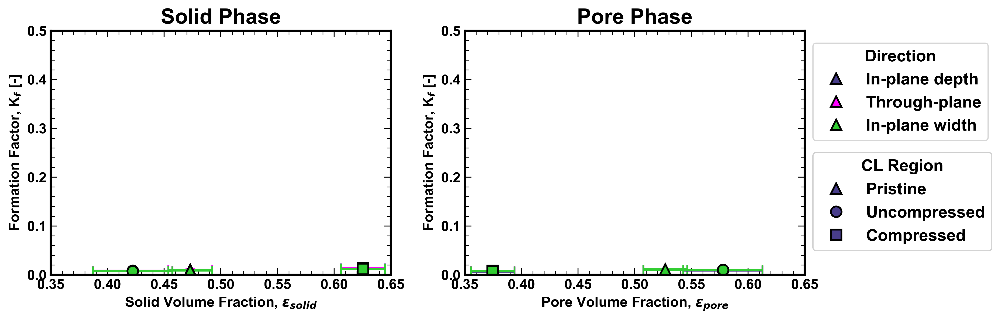

In [53]:
#plot Formation factor (Kf vs. VF)

fig = plt.figure(figsize=(12, 4), dpi=400)
ax1 = fig.add_subplot(121)   #top
ax2 = fig.add_subplot(122)   #top

colors = ['darkslateblue','magenta','limegreen']
shapes = ['^','o', 's']
styles = ['auto','white']
phases = ['Solid','Void']
sampleNames = ['Pristine','Uncompressed','Compressed']
directionNames = ['In-plane depth','Through-plane','In-plane width']

#ax1 is Solid Phase
#ax2 is Void phase
for p,phase in enumerate(avg_kf):
    for s,sample in enumerate(phase):
        for d, direction in enumerate(sample):
            
            if p == 0:
                ax1.errorbar(avg_volFrac[p][s], direction, xerr=std_volFrac[p][s], yerr=std_kf[p][s][d], fmt=shapes[s], 
                             markersize=9, color=colors[d],elinewidth=2, capsize=4, markerfacecolor=styles[0],
                             markeredgewidth=1.5,markeredgecolor='k',label=directionNames[d])
            elif p == 1:
                ax2.errorbar(avg_volFrac[p][s], direction, xerr=std_volFrac[p][s], yerr=std_kf[p][s][d], fmt=shapes[s], 
                             markersize=9, color=colors[d],elinewidth=2, capsize=4, markerfacecolor=styles[0],
                             markeredgewidth=1.5,markeredgecolor='k',label=directionNames[d])

                
ax1.set_ylabel('Formation Factor, K$_f$ [-]')
ax1.set_xlabel(r"Solid Volume Fraction, $\varepsilon_{solid}$")
ax1.set_xlim([0.35,0.65])
ax1.set_ylim([0,0.5])
ax1.set_title('Solid Phase',fontsize=18,weight='bold')

ax2.set_ylabel('Formation Factor, K$_f$ [-]')
ax2.set_xlabel(r"Pore Volume Fraction, $\varepsilon_{pore}$")
ax2.set_xlim([0.35,0.65])
ax2.set_ylim([0,0.5])
ax2.set_title('Pore Phase',fontsize=18,weight='bold')

# handles, labels = ax1.get_legend_handles_labels()
# handles = [h[0] for h in handles]
# # use them in the legend
# lgd1 = ax1.legend(handles[-3:], labels[-3:], numpoints=1,
#                   loc='upper left',fontsize=12,title=r'Bruggeman Fit, $y = \varepsilon_{solid}^{\alpha}$', 
#                   title_fontsize=12, frameon=False)

# handles, labels = ax2.get_legend_handles_labels()
# handles = [h[0] for h in handles]
# lgd2 = ax2.legend(handles[-3:], labels[-3:], numpoints=1,
#                   loc='upper left',fontsize=12,title=r'Bruggeman Fit, $y = \varepsilon_{pore}^{\alpha}$', 
#                   title_fontsize=12, frameon=False)
# ax2.add_artist(lgd2)

handles, labels = ax1.get_legend_handles_labels()
handles = [h[0] for h in handles]
# labels=[""]
lgd3 = ax2.legend(handles[0:3], labels[0:3], numpoints=1,
                  loc='center left',bbox_to_anchor=(1,0.75),
                  fontsize=14, title="Direction",title_fontsize=14, frameon=True)
ax2.add_artist(lgd3)

handles, labels = ax2.get_legend_handles_labels()
handles = [h[0] for h in handles]
# labels=[""]
lgd4 = ax2.legend(handles[0:9:3], sampleNames, numpoints=1,
                  loc='center left',bbox_to_anchor=(1,0.3),
                  fontsize=14,title="CL Region", title_fontsize=14, frameon=True)
ax2.add_artist(lgd4)

# plt.savefig("kf_vs_VF_OpenPNM.png",dpi = 400, bbox_inches='tight')


(6.000000000000027e-09, 1.224e-06, 6.000000000000027e-09, 1.224e-06)

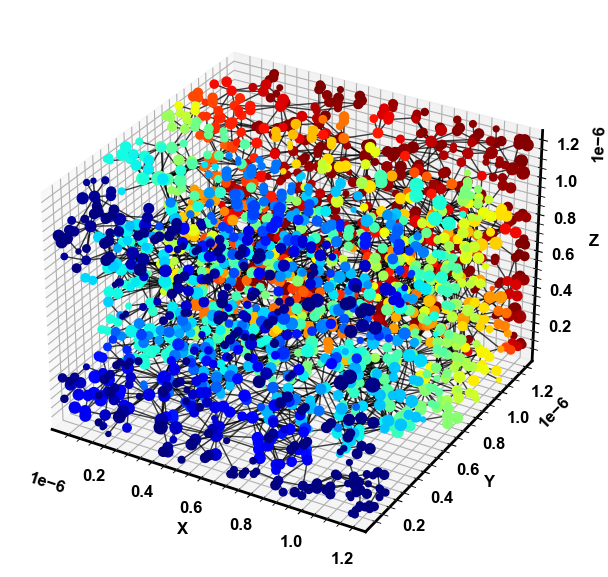

In [15]:
fig, ax = plt.subplots(figsize=[6, 6])
op.topotools.plot_connections(ax=ax,
                                  network=pn[0][0][0],
                                  alpha=0.75, linewidth=1,color='black'
                                  )
op.topotools.plot_coordinates(ax=ax,
                                  network=pn[0][0][0],
                                  size_by=(pn[0][0][0]["pore.diameter"]),
                                  color_by=oc[0][0][0]["pore.voltage"],
                                  markersize=100)

plt.axis('on')
# plt.savefig('openpnm_OC_alg_example_1p2um.png',dpi = 400, bbox_inches='tight')

# Step 3: Imbibition and Water Retention Curves
## Void phase only, pn[1] = void phase network data

In [73]:
O2 = []
H2O = []

In [75]:
##TEST

import openpnm.phases.mixtures.species.gases as speciesGases

mods = op.models


# Creating O2 custom phase
O2 = []
for s,sample in enumerate(pn[1]):
    sample_O2_temp = []
    for r,region in enumerate(sample):
        O2_i = speciesGases.O2(network=region)
        sample_O2_temp.append(O2_i)
    O2.append(sample_O2_temp)

ModuleNotFoundError: No module named 'openpnm.phases'

In [19]:
print(O2[1][0])
print(O2[1][0]['pore.molar_diffusion_volume'])

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
openpnm.phases.mixtures.species.gases.O2 : phase_02
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
#     Properties                                    Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
1     pore.molar_diffusion_volume                    1301 / 1301 
2     pore.molecular_weight                          1301 / 1301 
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
#     Labels                                        Assigned Locations
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
1     pore.all                                      1301      
2     throat.all                                    2568      
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
[16.6 16.6 16.6 ... 16.6 16.6 16.6]


In [20]:
for s,sample in enumerate(pn[1]):
    sample_water_temp = []
    for r,region in enumerate(sample):
        H2O_i = op.phases.Water(network = region, name = 'water')
#         H2O_i['pore.temperature'] = 80 + 273.15
#         H2O_i['pore.contact_angle'] =  75  #wettability
#         H2O_i['pore.surface_tension'] = 0.0626 # of water N/m @ 80C
#         H2O_i['throat.contact_angle'] =  75  #wettability
#         H2O_i['throat.surface_tension'] = 0.0626 # of water N/m @ 80C

        sample_water_temp.append(H2O_i)
    H2O.append(sample_water_temp)

In [21]:
print(H2O[1][0])
print(H2O[1][0]['pore.diffusivity'])

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
openpnm.phases.Water : water
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
#     Properties                                    Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
1     pore.contact_angle                             1301 / 1301 
2     pore.critical_pressure                         1301 / 1301 
3     pore.critical_temperature                      1301 / 1301 
4     pore.critical_volume                           1301 / 1301 
5     pore.density                                   1301 / 1301 
6     pore.diffusivity                               1301 / 1301 
7     pore.electrical_conductivity                   1301 / 1301 
8     pore.molar_density                             1301 / 1301 
9     pore.molecular_weight                          1301 / 1301 
10    pore.pressure                                  1301 / 1301 
11    por

In [37]:
#Defining Phase (from MA)
#-----------------------------------------------------------------------------

#Only do on Void Phase (phase=1, so pn[1] = void phase data)


mods = op.models


#Creating O2 custom phase
O2 = []
for s,sample in enumerate(pn[1]):
    sample_O2_temp = []
    for r,region in enumerate(sample):
        O2_i = op.phases.GenericPhase(network=region, name = 'O2')
        O2_i['pore.molecular_weight'] = 0.0319988 #kg/mol
        O2_i['pore.critical_pressure'] = 5.043 #MPa, Cardoso, 1915
        O2_i['pore.critical_temperature'] = 155.15 #K, Cardoso, 1915
        O2_i['pore.critical_volume'] = 0.0025 #m3/kg, Engineering Toolbox
        O2_i['pore.contact_angle'] = 105
#         O2_i['pore.surface_tension'] = 0.0626 # of water N/m @ 80C
        O2_i['pore.temperature'] = 80 + 273.15 #K
        O2_i.add_model(propname='pore.molar_density',
                   model=mods.phases.molar_density.ideal_gas)
        O2_i.add_model(propname='pore.diffusivity',
                   model=mods.misc.constant,
                   value = 29.1
#                        MA=0.032, MB=0.02897,
#                    vA=16.6, vB=20.1
                      ) #O2 and air moleuclar weights and diffusion volumes
                                    #http://websites.umich.edu/~elements/course/lectures/eleven/exam4.htm
        O2_i.add_model(propname='pore.thermal_conductivity',
                   model=mods.misc.constant,
                   value = 0.026
#                    prop='pore.temperature',
#                    a=[-0.001285, 0.000107, -0.00000005263, 
#                       0.00000000002568, -5.04E-015]
                    )
        O2_i.add_model(propname='pore.electrical_conductivity',
                   model=mods.misc.constant,
                   value=1e-15)
        O2_i.add_model(propname='pore.viscosity',
                   model=mods.misc.polynomial,
                   prop='pore.temperature',
                   a=[-0.000001,9.262500e-08,-8.065700e-11,
                      5.113000e-14,-1.295000e-17])  
        sample_O2_temp.append(O2_i)
    O2.append(sample_O2_temp)

#Adding water phase with specific wettalbility
H2O = []
for s,sample in enumerate(pn[1]):
    sample_water_temp = []
    for r,region in enumerate(sample):
        H2O_i = op.phases.Water(network = region, name = 'water')
        H2O_i['pore.temperature'] = 80 + 273.15
        H2O_i['pore.contact_angle'] =  75  #wettability
        H2O_i['pore.surface_tension'] = 0.0626 # of water N/m @ 80C
#         H2O_i['throat.contact_angle'] =  75  #wettability
#         H2O_i['throat.surface_tension'] = 0.0626 # of water N/m @ 80C

        sample_water_temp.append(H2O_i)
    H2O.append(sample_water_temp)


In [38]:
print(H2O[1][0])

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
openpnm.phases.Water : water
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
#     Properties                                    Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
1     pore.contact_angle                             1301 / 1301 
2     pore.critical_pressure                         1301 / 1301 
3     pore.critical_temperature                      1301 / 1301 
4     pore.critical_volume                           1301 / 1301 
5     pore.density                                   1301 / 1301 
6     pore.diffusivity                               1301 / 1301 
7     pore.electrical_conductivity                   1301 / 1301 
8     pore.molar_density                             1301 / 1301 
9     pore.molecular_weight                          1301 / 1301 
10    pore.pressure                                  1301 / 1301 
11    por

In [39]:

def washburn(phase,
             surface_tension="throat.surface_tension",
             contact_angle="throat.contact_angle",
             diameter="throat.diameter"):
    r"""
    Computes the capillary entry pressure assuming the throat in a
    cylindrical tube.

    Parameters
    ----------
    %(phase)s
    surface_tension : str
        %(dict_blurb)s surface tension. If a pore property is given, it is
        interpolated to a throat list.
    contact_angle : str
        %(dict_blurb)s contact angle. If a pore property is given, it is
        interpolated to a throat list.
    diameter : str
        %(dict_blurb)s throat diameter

    Returns
    -------
    %(return_arr)s capillary entry pressure

    Notes
    -----
    The Washburn equation is:

    .. math::
        P_c = -\frac{2\sigma(cos(\theta))}{r}

    This is the most basic approach to calculating entry pressure and is
    suitable for highly non-wetting invading phases in most materials.

    """
    network = phase.network
    sigma = phase[surface_tension]
    theta = phase[contact_angle]
    r = network[diameter] / 2
    value = -2 * sigma * _np.cos(_np.radians(theta)) / r
    if diameter.split(".")[0] == "throat":
        pass
    else:
        value = value[phase.pores()]
    value[_np.absolute(value) == _np.inf] = 0
    return value

In [40]:
# Defining Physics (From MA)
#-----------------------------------------------------------------------------

#Oxygen
phys_oxygen = []
for s,sample in enumerate(O2):
    sample_O2_temp = []
    for r,region in enumerate(sample):
        physics_o = op.physics.Standard(network=pn[1][s][r],  phase=region, geometry=geo[1][s][r])
        sample_O2_temp.append(physics_o)
    phys_oxygen.append(sample_O2_temp)

#Water
phys_water = []
for s,sample in enumerate(H2O):
    sample_H2O_temp = []
    for r,region in enumerate(sample):
        physics_w = op.physics.Standard(network=pn[1][s][r],  phase=region, geometry=geo[1][s][r])
        physics_w.add_model(model=mods.physics.capillary_pressure.washburn,
                             propname='pore.entry_pressure',
                             surface_tension="pore.surface_tension",
                             contact_angle="pore.contact_angle",
                             diameter="pore.diameter",
                            )
        physics_w.add_model(model=mods.physics.capillary_pressure.washburn,
                             propname='throat.entry_pressure',
                             surface_tension="throat.surface_tension",
                             contact_angle="throat.contact_angle",
                             diameter="throat.diameter",
                            )#Capillary pressure, Young-Laplace
        sample_H2O_temp.append(physics_w)
    phys_water.append(sample_H2O_temp)

------------------------------------------------------------
ERROR      : throat.entry_pressure was not run since the following property is missing:
             'pore.surface_tension' 
SOURCE     : openpnm.core.ModelsMixin._regen 
TIME STAMP : 2024-08-16 19:04:26,443
------------------------------------------------------------
------------------------------------------------------------
ERROR      : throat.entry_pressure was not run since the following property is missing:
             'pore.surface_tension' 
SOURCE     : openpnm.core.ModelsMixin._regen 
TIME STAMP : 2024-08-16 19:04:26,511
------------------------------------------------------------
------------------------------------------------------------
ERROR      : throat.entry_pressure was not run since the following property is missing:
             'pore.surface_tension' 
SOURCE     : openpnm.core.ModelsMixin._regen 
TIME STAMP : 2024-08-16 19:04:26,580
------------------------------------------------------------
----------

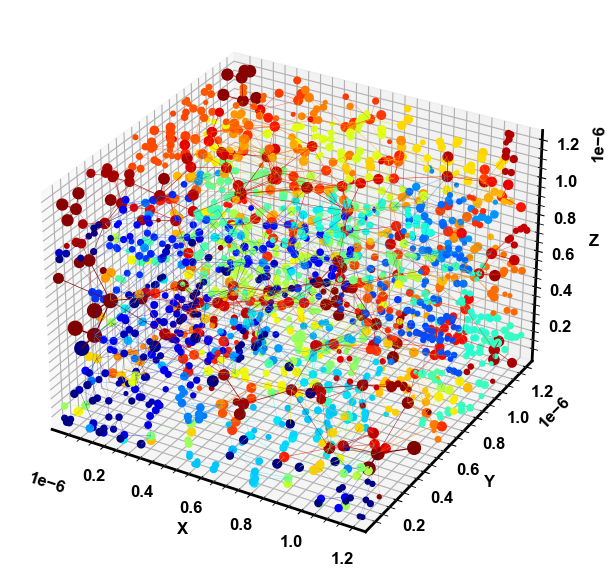

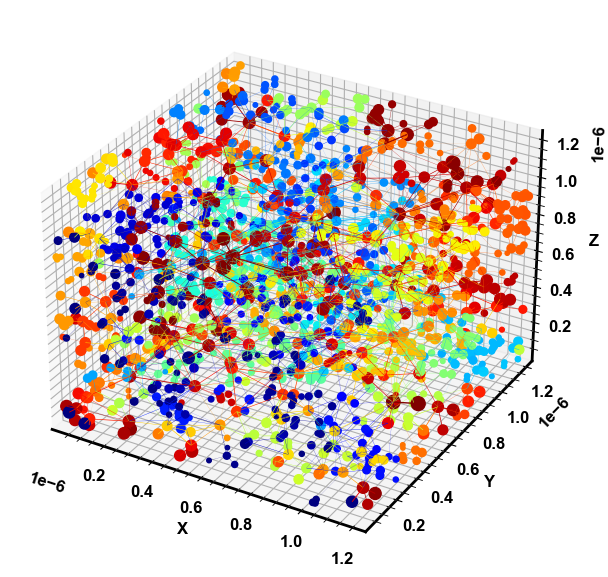

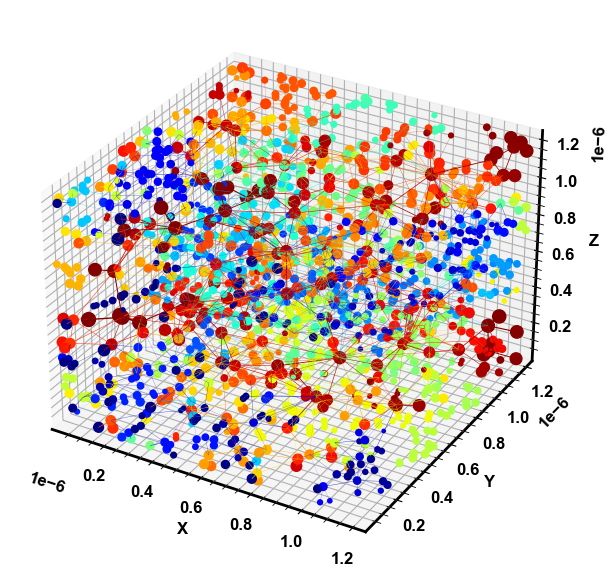

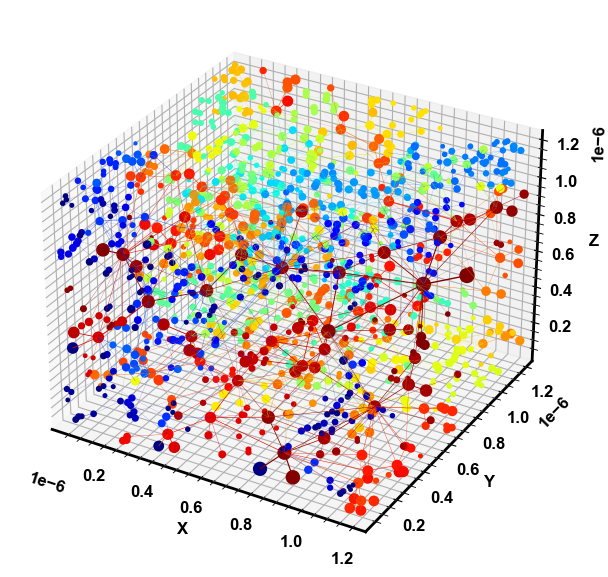

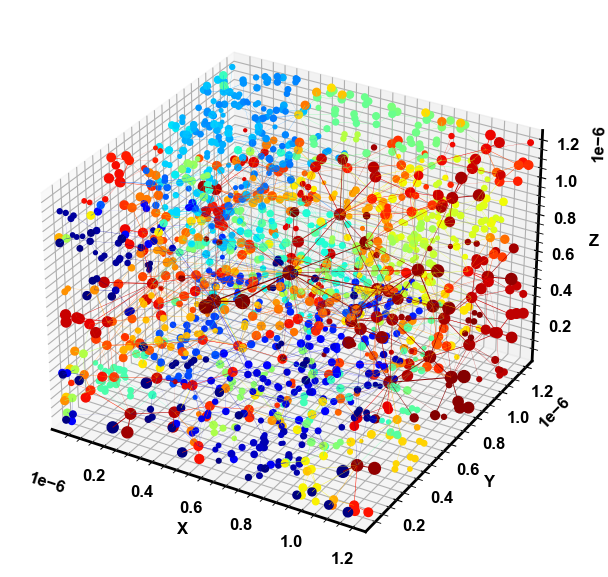

...

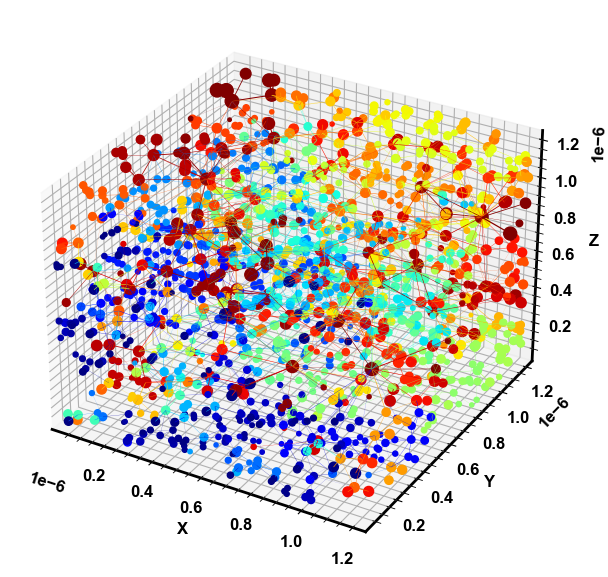

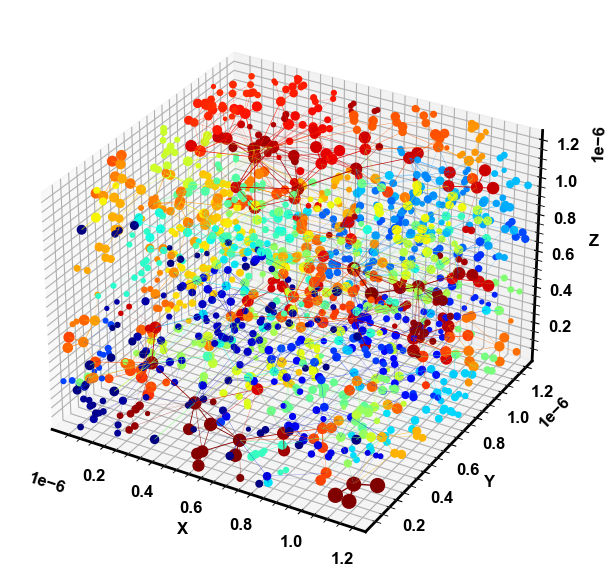

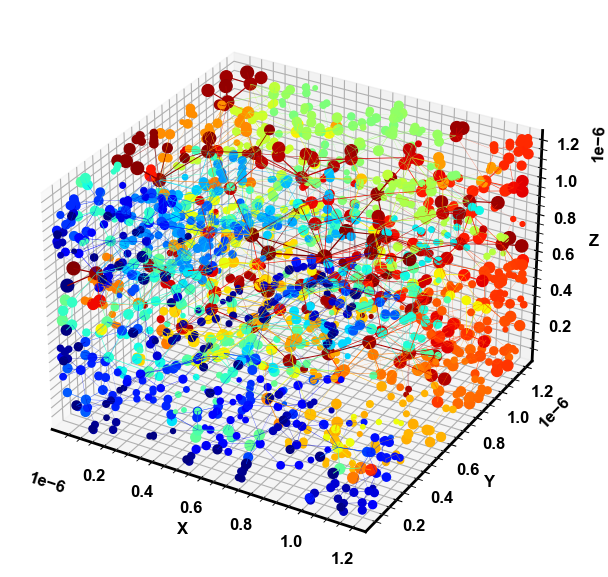

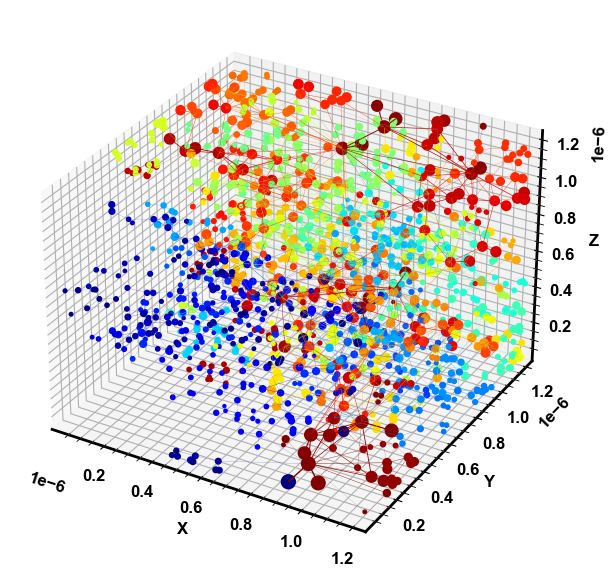

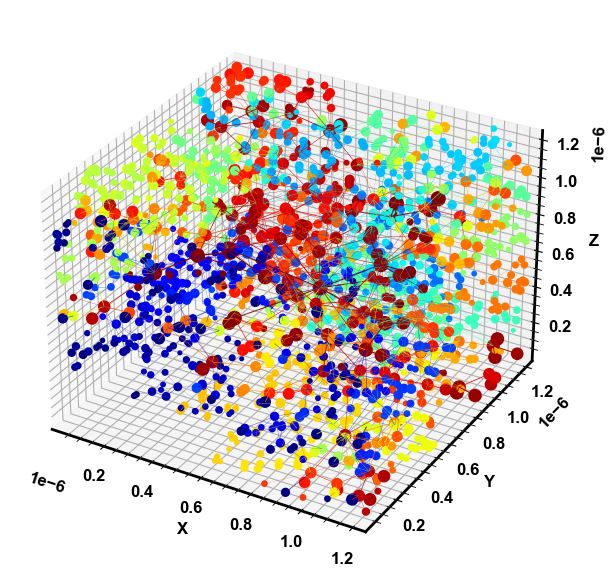

In [41]:
#Imbibtion algorithm to invade pores with water (from MA)

directionNames = ['In-plane depth','Through-plane','In-plane width']
directions = [['xmin','xmax'],['ymin','ymax'],['zmin','zmax']]

IMB = []
for s,sample in enumerate(pn[1]):
    sample_IMB = []
    for r, region in enumerate(sample):

        inlets = region.pores(directions[1][0])
        used_inlets = [inlets[y] for y in range(0, len(inlets), 2)]
        op.algorithms.MixedInvasionPercolation(network=region).reset()
        perc = op.algorithms.MixedInvasionPercolation(network=region)
        perc.setup(phase = H2O[s][r])
        perc.set_inlets(pores = used_inlets)
        perc.run()
#             print(perc)
        fig, ax = plt.subplots(figsize=[6, 6])

        op.topotools.plot_coordinates(ax=ax,
                                  network=region,
                                  size_by=region["pore.diameter"],
                                  color_by=perc["pore.invasion_sequence"],
                                  markersize=100)
        op.topotools.plot_connections(ax=ax,
                                  network=region,
                                  size_by=region["throat.diameter"],
                                  color_by=perc["throat.invasion_sequence"],
#                                   linesize=10
                                     )
    
        
        plt.axis('on')
        plt.show()

        sample_IMB.append(perc)
    IMB.append(sample_IMB)
            
            

In [43]:
print(np.shape(IMB[0]))
print(IMB[0][0])



(6,)
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
openpnm.algorithms.MixedInvasionPercolation : alg_05
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
#     Properties                                    Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
1     pore.cluster                                   1669 / 1669 
2     pore.entry_pressure                            1669 / 1669 
3     pore.invasion_pressure                         1669 / 1669 
4     pore.invasion_saturation                       1669 / 1669 
5     pore.invasion_sequence                         1669 / 1669 
6     pore.trapped                                   1669 / 1669 
7     throat.cluster                                 3281 / 3281 
8     throat.entry_pressure                          3281 / 3281 
9     throat.invasion_pressure                       3281 / 3281 
10    throat.invasion_saturation              

In [44]:
#analyze imbibition data
raw_data = []
pc = []
sat_tot = []
# sat_throat = []
# sat_pore = []


for s,sample in enumerate(IMB):
    sample_raw_data = []
    sample_pc = []
    sample_sat_tot = []
    for r,region in enumerate(sample):
        region_raw_data = []
        region_pc = []
        region_sat_tot = []
        
        data_i = region.get_intrusion_data()
        region_sat_tot.append(data_i.S_tot[0]) 
        region_pc.append(data_i.Pcap[0])
        
        for i,x in enumerate(data_i.S_tot):
            if  data_i.S_tot[i] - region_sat_tot[-1] > 0:
                region_pc.append(data_i.Pcap[i])
                region_sat_tot.append(data_i.S_tot[i])
                    
        sample_raw_data.append(data_i)
        sample_pc.append(region_pc)
        sample_sat_tot.append(region_sat_tot)
    raw_data.append(sample_raw_data)
    pc.append(sample_pc)
    sat_tot.append(sample_sat_tot)

In [45]:
print(IMB[0][0].get_intrusion_data())
print(-1909432.5558>-2415262.2891)

pc_curve(Pcap=array([-2415262.2891, -1909432.5558, -1800230.247 , -1497882.1205,
       -1350172.6853, -1309859.9362, -1272955.0729, -1207631.1445,
       -1151431.1104, -1102411.3411, -1080138.1482, -1059162.5924,
       -1039363.4602, -1002883.1065,  -986026.678 ,  -940139.5881,
        -912883.3185,  -900115.1235,  -887868.0612,  -876107.7376,
        -853924.1737,  -843446.1773,  -814184.7415,  -805087.4583,
        -796288.4012,  -779522.5773,  -771527.2487,  -763773.0094,
        -748941.0602,  -741841.9266,  -734940.9179,  -721697.6364,
        -715338.9811,  -709145.4273,  -703110.0534,  -691487.5805,
        -685888.425 ,  -675086.3426,  -669873.2411,  -664779.0518,
        -659799.423 ,  -654929.9681,  -650166.7938,  -645506.026 ,
        -636477.5365,  -632103.0591,  -627817.5337,  -623618.0189,
        -619501.6903,  -615465.834 ,  -611507.8413,  -603815.5723,
        -600076.749 ,  -596406.4907,  -592802.8227,  -589263.6564,
        -585787.1605,  -582371.4471,  -572472.08

In [55]:
# s=0
# r=0
# region = pn[1][s][r]


# print(H2O[s][r]['pore.occupancy'])
# # print(region['pore.coords'])
# # print(region)

# for j, Pc in enumerate(pc[s][r]):
#         update_phase_and_phys(IMB[s][r].results(Pc=Pc), region, H2O[s][r], O2[s][r], phys_water[s][r],phys_oxygen[s][r])
#         print('-' * 80)
#         print('Pc', Pc)
#         print('S_tot', sat_tot[s][r][j])
#         fig = plt.figure(figsize=[6, 6])
#         ax = plt.axes(projection ="3d")

#         x_coords = []
#         y_coords = []
#         z_coords = []
#         for i in range(len(pn[1][s][r]['pore.coords'])):
#             y_coords.append(pn[1][s][r]['pore.coords'][i][0])
#             z_coords.append(-1*pn[1][s][r]['pore.coords'][i][1])
#             x_coords.append(pn[1][s][r]['pore.coords'][i][2])


# #         ax.scatter3D(x_coords,y_coords,z_coords,edgecolor='black',s = 2**(region['pore.diameter']/np.max(region['pore.diameter'])*7)*5,
# #                     c=H2O[s][r]['pore.occupancy'],cmap='cool_r',vmin=0,vmax=1, alpha=0.9)
        
#         ax.scatter3D(x_coords,y_coords,z_coords,edgecolor='black',s = 2**(region['pore.diameter']/np.max(region['pore.diameter'])*7)*5,
#                     c=H2O[s][r]['pore.occupancy'],cmap='jet',vmin=0,vmax=1, alpha=0.9)
#         plt.title('Capillary Pressure: '+'{:.2e}'.format(-Pc)+ ' [Pa]'  + '\n'+ 'Saturation (Water): '+'{:.3f}'.format(sat_tot[s][r][j])+ ' [-]'
#                  )

# #         plt.grid(False)
# #         plt.axis('off')
#         plt.show()
# #         plt.savefig('./animation_test/{}_{}_{:.2f}.tif'.format(sampleNames[s], r, sat_tot[s][r][j]),bbox_inches='tight',
# #                    edgecolor='none', dpi=400)


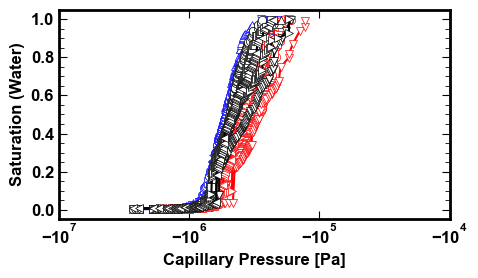

In [46]:
#Plot S_tot intrusion curves for all samples and regions
fig1, ax1 = plt.subplots(1, 1, figsize =[5,3])
line_colors =['k','r','b']
shapes = ['^','o','s','v','>','<']
zorders = [100,99,98]

for s,sample in enumerate(pc):
    for r,region in enumerate(sample):
        ax1.plot(region,sat_tot[s][r],color = line_colors[s], marker = shapes[r], 
                 markeredgewidth=0.5, markerfacecolor='white',zorder=zorders[s])
        
# ax1.legend(loc = 'best')
ax1.set_xlabel("Capillary Pressure [Pa]")
ax1.set_ylabel("Saturation (Water)")
ax1.set_xscale('symlog')
ax1.set_xlim([-10**7, -10**4])
plt.tick_params(axis='x', which='minor')
# ax1.set_title('Total Saturation', fontweight = 'bold')
# plt.savefig('imbibition_all_allpoints.png',\
#                 transparent = True, dpi = 400, bbox_inches='tight')

In [47]:
line_colors =['k','r','b']
shapes = ['^','o','s','v','>','<']
zorders = [100,99,98]

j_lev = []
for s,sample in enumerate(pc):
    j_lev_sample = []
    for r,region in enumerate(sample):
        j_lev_region = []
        for x in region:
            j = -x*np.sqrt(avg_K_sp[s]/avg_volFrac[1][s])/(0.072*np.cos(np.deg2rad(75)))
            j_lev_region.append(j)
        j_lev_sample.append(j_lev_region)
    j_lev.append(j_lev_sample)
    
    
fig1, ax1 = plt.subplots(1, 1, figsize =[5,3])

for s,sample in enumerate(sat_tot):
    for r,region in enumerate(sample):
        ax1.plot(sat_tot[s][r],j_lev[s][r],color = line_colors[s], marker = shapes[r], 
                 markeredgewidth=0.5, markerfacecolor='white',zorder=zorders[s])

NameError: name 'avg_K_sp' is not defined

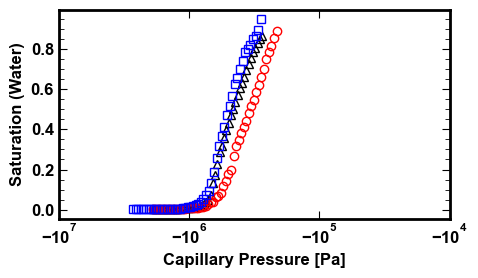

In [48]:
#interpolation to average water retention curves for each sample across regions

x_interp = []
y_interp = []

x_all = []
f_avg = []

for s,sample in enumerate(pc):
    
    sample_x_data = []
    sample_y_data = []
    sample_x_min_vals = []
    sample_x_max_vals = []
    sample_interp_funcs = []
    for r,region in enumerate(sample):
        sample_x_data.append(region)
        sample_y_data.append(sat_tot[s][r])
        sample_x_max_vals.append(max(region))
        sample_x_min_vals.append(min(region))
        sample_interp_funcs.append(interp1d(region, sat_tot[s][r]))
        
    x_max = math.floor(min(sample_x_max_vals))
    x_min = math.ceil(max(sample_x_min_vals))
    
    # define common carrier for calculation of average curve
    sample_x_all   = np.geomspace(x_min, x_max, num=50)
    
    sample_f_int = []
    for r,region in enumerate(sample):
        # evaluation of fits on common carrier
        sample_f_int.append(sample_interp_funcs[r](sample_x_all))
        
    # put all fits to one matrix for fast mean calculation
    data_collection = np.vstack(sample_f_int)

    # calculating mean value
    sample_f_avg = np.average(data_collection, axis=0)

    x_interp.append(sample_x_data)
    y_interp.append(sample_y_data)
    x_all.append(sample_x_all)
    f_avg.append(sample_f_avg)


# print(len(x_all))
#plot
fig1, ax1 = plt.subplots(1, 1, figsize =[5,3])

# ax1.legend(loc = 'best')
ax1.set_xlabel("Capillary Pressure [Pa]")
ax1.set_ylabel("Saturation (Water)")
ax1.set_xscale('symlog')
ax1.set_xlim([-10**7, -10**4])
# plt.tick_params(axis='x', which='minor')
colors =['k','r','b']
shapes = ['^','o', 's']


for s,sample in enumerate(f_avg):
    ax1.plot(x_all[s],f_avg[s],' ',color=colors[s], marker=shapes[s], markerfacecolor='none')
plt.show()


# water_retention_pnm_pris = [x_all, f_avg]

In [49]:
#sample regions
title = ['Pristine', 'Uncompressed', 'Compressed']

#log normal parameters

#log normal mean (diam [nm])
ln_mu_diam = np.array([4.6565,4.9255,4.5715])
#log normal std (same for diam or radius)
ln_sigma = np.array([0.6352,0.7396,0.6127])

#log normal mean (radius) = Ln(exp(mu_diam)/2)
ln_mu_rad = np.log(np.exp(ln_mu_diam)/2)
print('ln_mu_rad: ',ln_mu_rad)

# #####cdf
# #log normal mean (diam [nm])
# ln_mu_cdf = np.array([4.0945,4.319,3.9219])
# #log normal std (same for diam or radius)
# ln_sigma_cdf = np.array([0.5339,0.6417,0.5044])

#mean value from log normal dist is E(X) = exp(mu+0.5*sigma^2)
rm = np.exp(ln_mu_rad + (ln_sigma**2/2))*10**-9
print('Rm: ',rm)

# sigma_m = np.exp(ln_sigma_cdf**2/2)

##trying to fix sigma 
# var = (rm*10**9)**2 *(np.exp(ln_sigma**2)-1)
# sigma_new = np.sqrt(sigma)
# print(sigma_new)


gamma = 0.0626
theta = 75

def rc(pc):
    return 2*gamma*np.cos(np.deg2rad(theta))/pc
def s(pc,rm,sig):
    sig = sig/2
    return 0.5*(1+sp.special.erf((np.log(rc(pc)/rm))/(sig*np.sqrt(2))))
pres_cap = np.logspace(7,4, 100)

#saturation data
sat_curves = []
for i, x in enumerate(rm):
    sat_curves.append(s(pres_cap,x,ln_sigma[i]))
    

ln_mu_rad:  [3.9634 4.2324 3.8784]
Rm:  [6.4399e-08 9.0546e-08 5.8326e-08]


NameError: name 'f_avg' is not defined

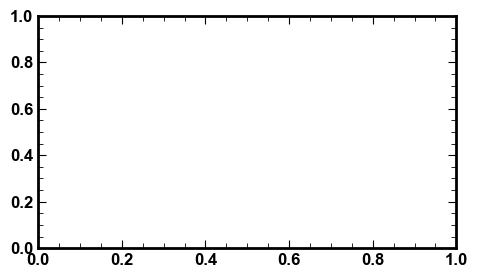

In [76]:
#plot water retention comparison between PNM and PSD values
fig1, ax1 = plt.subplots(1, 1, figsize =[5,3])

colors = ['k','r','b']
zorder = [1,2,0]
shapes = ['^','o', 's']
titles = ['Pristine','Uncompressed','Compressed']

# for i,y in enumerate(sat_curves):
#     ax1.plot(-pres_cap,y, '-', color=colors[i], label='PSD - {}'.format(title[i]), markerfacecolor='white', zorder=zorder[i], 
#              markeredgewidth=1.5)
    
    
for s,sample in enumerate(f_avg):
    # ax1.plot(x_all[s]*-1,f_avg[s],' ',color=colors[s], marker=shapes[s], markerfacecolor='white',zorder=zorder[s], 
    #          label = 'PNM - {}'.format(titles[s]))
    ax1.plot(pres_cap, sat_curves[s],'-', color=colors[s], zorder=zorder[s], label='PSD - {}'.format(titles[s]))

ax1.set_xlabel("Capillary Pressure [Pa]")
ax1.set_ylabel("Saturation (Water)")
ax1.set_xscale('log')
ax1.set_xlim([10**7, 10**4])
ax1.set_ylim([-0.05,1.05])

ax1.legend(loc = 'lower right', fontsize=9)


plt.tick_params(axis='x', which='minor')

plt.savefig('water_retention_curves_cdf.png',\
                transparent = False, dpi = 400, bbox_inches='tight')

In [51]:
print(x_all[0])

[-1909432.     -1835427.1886 -1764290.6187 -1695911.1244 -1630181.8484
 -1567000.0748 -1506267.0688 -1447887.9224 -1391771.4057 -1337829.8249
 -1285978.885  -1236137.5579 -1188227.9561 -1142175.2106 -1097907.3545
 -1055355.2098 -1014452.2799  -975134.6453  -937340.8639  -901011.875
  -866090.907   -832523.3883  -800256.8628  -769240.9072  -739427.0524
  -710768.7082  -683221.0897  -656741.1481  -631287.5028  -606820.3772
  -583301.5362  -560694.2267  -538963.12    -518074.2567  -497994.9935
  -478693.9524  -460140.9713  -442307.0575  -425164.3415  -408686.0344
  -392846.3853  -377620.6414  -362985.0092  -348916.6176  -335393.4817
  -322394.4687  -309899.2649  -297888.3441  -286342.9365  -275245.    ]


In [52]:
j_lev = []
for s,sample in enumerate(x_all):
    j_lev_sample = []
    print('por: ', avg_volFrac[1][s])
    print('K: ', avg_K_sp[s])
    for x in sample:
        j = x*np.sqrt(avg_K_sp[s]/avg_volFrac[1][s])/(0.072*np.cos(np.deg2rad(75)))

        j_lev_sample.append(j)
    j_lev.append(j_lev_sample)
    
#plot water retention comparison between PNM and PSD values
fig1, ax1 = plt.subplots(1, 1, figsize =[5,3])

colors = ['k','r','b']
zorder = [2,1,0]
shapes = ['^','o', 's']
titles = ['Pristine','Uncompressed','Compressed']

# for i,y in enumerate(sat_curves):
#     ax1.plot(-pres_cap,y, '-', color=colors[i], label='PSD - {}'.format(title[i]), markerfacecolor='white', zorder=zorder[i], 
#              markeredgewidth=1.5)
    
    
for s,sample in enumerate(j_lev):
    ax1.plot(f_avg[s],j_lev[s],' ',color=colors[s], marker=shapes[s], markerfacecolor='white',zorder=zorder[s]+100, 
             label = titles[s])

ax1.set_ylabel(r"$J(S_w) = \frac{P_c(S_w)}{\gamma \cos{\theta}}\sqrt{\frac{k}{\epsilon_{pore}}}$")
ax1.set_xlabel("Saturation (Water)")
# ax1.set_yscale('log')
ax1.set_xlim([-0.05, 1.05])
ax1.set_ylim([-2.05, 0.05])

ax1.legend(loc = 'best')


plt.tick_params(axis='x', which='minor')

plt.savefig('J-leverett_function.png',\
                transparent = True, dpi = 400, bbox_inches='tight')

por:  0.5125989140703742


NameError: name 'avg_K_sp' is not defined

# Step 4: Multiphase Permbeability and Diffusivity

In [53]:
#Multiphase diffusivity and permeability
#-----------------------------------------------------------------------------
#Define a helper function to update the phases and properties with the results of the OP algorithm
def update_phase_and_phys(results, network, phaseW, phaseO, physicsW, physicsO):
    phaseW['pore.occupancy'] = results['pore.occupancy']/network['pore.volume']
    phaseO['pore.occupancy'] = 1 - phaseW['pore.occupancy']
    phaseW['throat.occupancy'] = results['throat.occupancy']/network['throat.volume']
    phaseO['throat.occupancy'] = 1 - phaseW['throat.occupancy']
    # Add multiphase conductances
    mode='strict'
    physicsO.add_model(model=mods.physics.multiphase.conduit_conductance,
                       propname='throat.conduit_diffusive_conductance',
                       throat_conductance='throat.diffusive_conductance',
                       mode=mode)
    physicsW.add_model(model=mods.physics.multiphase.conduit_conductance,
                         propname='throat.conduit_diffusive_conductance',
                         throat_conductance='throat.diffusive_conductance',
                         mode=mode)
    physicsO.add_model(model=mods.physics.multiphase.conduit_conductance,
                       propname='throat.conduit_hydraulic_conductance',
                       throat_conductance='throat.hydraulic_conductance',
                       mode=mode)
    physicsW.add_model(model=mods.physics.multiphase.conduit_conductance,
                         propname='throat.conduit_hydraulic_conductance',
                         throat_conductance='throat.hydraulic_conductance',
                         mode=mode)

In [54]:
#make length and area arrays
length_tot = []
area_tot = []

for p, phase in enumerate(im_total):
    phase_length = []
    phase_area = []
    for s,sample in enumerate(phase):
        sample_length = []
        sample_area = []
        for r,region in enumerate(sample):
            region_length = []
            region_area = []
            for d in range(3):
                L = region.shape[d]*voxel_size
                A = (region.shape[(d+1)%3]*voxel_size)*(region.shape[(d+2)%3]*voxel_size)
                region_length.append(L)
                region_area.append(A)
            sample_length.append(region_length)
            sample_area.append(region_area)
        phase_length.append(sample_length)
        phase_area.append(sample_area)
    length_tot.append(phase_length)
    area_tot.append(phase_area)


In [55]:
#------------------------------------
#Single phase diffusivity and permeability (from MA)

# print(pn[3])
# print(H2O[1]['throat.occupancy'])
# os.chdir('C:\\Users\\meaaz\\anaconda3\\Library\\bin')

directionNames = ['In-plane depth','Through-plane','In-plane width']
directions = [['xmin','xmax'],['ymin','ymax'],['zmin','zmax']]


K_O2_single_phase = [] 
D_O2_single_phase = [] 
K_water_single_phase = []
D_water_single_phase = []

#through-plane only (y), [p=1][s][r][d=1]
for s,sample in enumerate(pn[1]):
    sample_K_O2_single_phase = [] 
    sample_D_O2_single_phase = [] 
    sample_K_water_single_phase = []
    sample_D_water_single_phase = []

    for r, region in enumerate(sample):
        length = length_tot[1][s][r][1]
        area =  area_tot[1][s][r][1]
        region_K_O2_single_phase = [None, None, None]
        region_D_O2_single_phase = [None, None, None]
        region_K_water_single_phase = [None, None, None]
        region_D_water_single_phase = [None, None, None]
   

        for bound_increment in range(1,2):
            # Run Single phase algs effective properties
            BC1_pores = region.pores(labels=directions[bound_increment][0])
            BC2_pores = region.pores(labels=directions[bound_increment][1])

            # Effective permeability : air
            sf_O2 = op.algorithms.StokesFlow(network=region, phase = O2[s][r])
            sf_O2.settings['conductance'] = 'throat.hydraulic_conductance'
            sf_O2.set_value_BC(values=1, pores=BC1_pores)
            sf_O2.set_value_BC(values=0, pores=BC2_pores)
            sf_O2.run()
            region_K_O2_single_phase[bound_increment] = sf_O2.calc_effective_permeability(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])
            proj_total[1][s][r].purge_object(obj=sf_O2)

            # Effective diffusivity : air
            fd_O2 = op.algorithms.FickianDiffusion(network=region,phase = O2[s][r])
            fd_O2.settings['conductance'] = 'throat.diffusive_conductance'
            fd_O2.set_value_BC(values=1, pores=BC1_pores)
            fd_O2.set_value_BC(values=0, pores=BC2_pores)
            fd_O2.run()
            region_D_O2_single_phase[bound_increment] = fd_O2.calc_effective_diffusivity(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])
            proj_total[1][s][r].purge_object(obj=fd_O2)

            # Effective permeability : water
            sf_water = op.algorithms.StokesFlow(network=region, phase = H2O[s][r])
            sf_water.settings['conductance'] = 'throat.hydraulic_conductance'
            sf_water.set_value_BC(values=1, pores=BC1_pores)
            sf_water.set_value_BC(values=0, pores=BC2_pores)
            sf_water.run()
            region_K_water_single_phase[bound_increment] = sf_water.calc_effective_permeability(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])
            proj_total[1][s][r].purge_object(obj=sf_water)

            # Effective diffusivity : water
            fd_water = op.algorithms.FickianDiffusion(network=region,phase = H2O[s][r])
            fd_water.settings['conductance'] = 'throat.diffusive_conductance'
            fd_water.set_value_BC(values=1, pores=BC1_pores)
            fd_water.set_value_BC(values=0, pores=BC2_pores)
            fd_water.run()
            region_D_water_single_phase[bound_increment] = fd_water.calc_effective_diffusivity(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])
            proj_total[1][s][r].purge_object(obj=fd_water)
            
        sample_K_O2_single_phase.append(region_K_O2_single_phase)  
        sample_D_O2_single_phase.append(region_D_O2_single_phase)  
        sample_K_water_single_phase.append(region_K_water_single_phase)
        sample_D_water_single_phase.append(region_D_water_single_phase)
#         D_O2_single_phase.append(D_O2_single_phase_i) 
#         K_water_single_phase.append(K_water_single_phase_i)
#         D_water_single_phase.append(D_water_single_phase_i)
    K_O2_single_phase.append(sample_K_O2_single_phase)
    D_O2_single_phase.append(sample_D_O2_single_phase)
    K_water_single_phase.append(sample_K_water_single_phase)
    D_water_single_phase.append(sample_D_water_single_phase)


In [56]:
# print(np.shape(avg_volFrac))
# print(np.shape(K_water_single_phase))

avg_K_sp = []
std_K_sp = []

avg_K_sp_o2 = []
std_K_sp_o2 = []

avg_D_sp_water = []
std_D_sp_water = []

avg_D_sp_o2 = []
std_D_sp_o2 = []

for s,sample in enumerate(K_water_single_phase):
    sample_temp_K_water = []
    sample_temp_K_o2 = []
    sample_temp_D_water = []
    sample_temp_D_o2 = []

    for r,region in enumerate(sample):
        sample_temp_K_water.append(region[1])
        sample_temp_K_o2.append(K_O2_single_phase[s][r][1])
        sample_temp_D_water.append(D_water_single_phase[s][r][1])
        sample_temp_D_o2.append(D_O2_single_phase[s][r][1])

        
    avg_K_sp.append(np.average(sample_temp_K_water))
    std_K_sp.append(np.std(sample_temp_K_water))
    
    avg_K_sp_o2.append(np.average(sample_temp_K_o2))
    std_K_sp_o2.append(np.std(sample_temp_K_o2))
    
    avg_D_sp_water.append(np.average(sample_temp_D_water))
    std_D_sp_water.append(np.std(sample_temp_D_water))
    
    avg_D_sp_o2.append(np.average(sample_temp_D_o2))
    std_D_sp_o2.append(np.std(sample_temp_D_o2))

    
print(avg_K_sp)
print(avg_K_sp_o2)
print()
print(avg_D_sp_water)
print(avg_D_sp_o2)
print(avg_volFrac)

[7.986166755047948e-17, 1.0529588616677741e-16, 2.692461985625174e-17]
[7.986166755047923e-17, 1.0529588616677721e-16, 2.692461985625258e-17]

[2.2223106532168902e-10, 2.465507357179058e-10, 1.325635542115183e-10]
[3.948828689129634e-06, 5.14587261182364e-06, 1.831118461493733e-06]
[[0.4874 0.4483 0.5825]
 [0.5126 0.5517 0.4175]]


7.986166755047948e-17
1.0529588616677741e-16
2.692461985625174e-17
2.2223106532168902e-10
2.465507357179058e-10
1.325635542115183e-10
3.948828689129634e-06
5.14587261182364e-06
1.831118461493733e-06


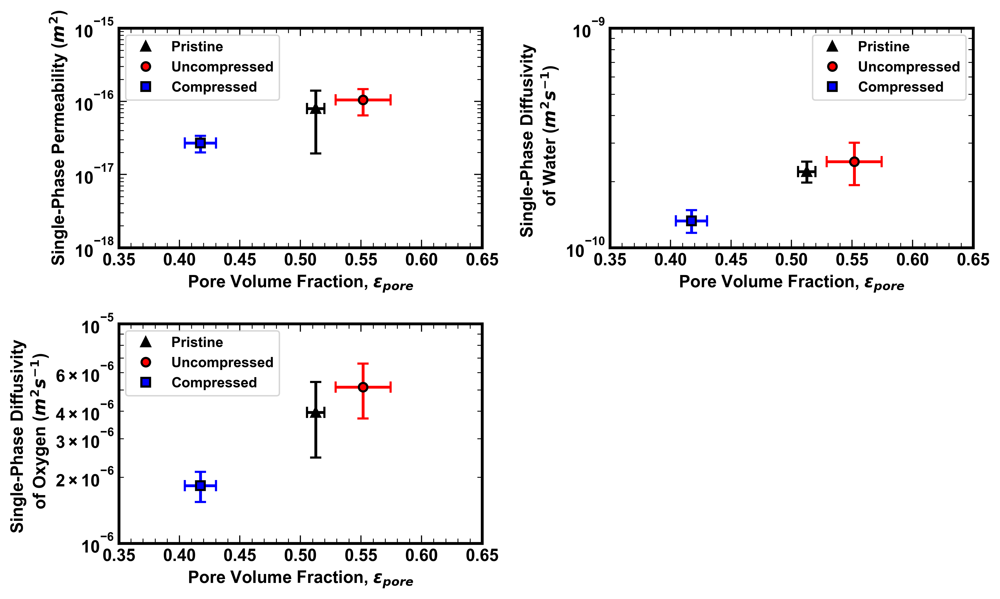

In [57]:
#plot single phase permeability vs. porosity(volFrac)
#water and O2 are the same

colors = ['k','r','b']
shapes = ['^','o', 's']
styles = ['auto','white']
phases = ['Solid','Void']
sampleNames = ['Pristine','Uncompressed','Compressed']

fig = plt.figure( figsize =[10,6], dpi=400)
ax1 = fig.add_subplot(221)   
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223)

ax1.set_yscale('log')
ax1.set_xlim([0.35,0.65])
ax1.set_ylim([1e-18,1e-15])

ax1.set_ylabel("Single-Phase Permeability ($m^2$)")
ax1.set_xlabel(r"Pore Volume Fraction, $\varepsilon_{pore}$")


for s,sample in enumerate(avg_K_sp):
    print(sample)
    ax1.errorbar(avg_volFrac[1][s], sample, xerr=std_volFrac[1][s], yerr=std_K_sp[s], fmt=shapes[s], 
                             markersize=6, color=colors[s],elinewidth=2, capsize=4, markerfacecolor=styles[0],
                             markeredgewidth=1.5,markeredgecolor='k',label=sampleNames[s])

ax1.set_yscale('log')
ax1.set_xlim([0.35,0.65])
ax1.set_ylim([1e-18,1e-15])

ax1.set_ylabel("Single-Phase Permeability ($m^2$)")
ax1.set_xlabel(r"Pore Volume Fraction, $\varepsilon_{pore}$")

for s,sample in enumerate(avg_D_sp_water):
    print(sample)
    ax2.errorbar(avg_volFrac[1][s], sample, xerr=std_volFrac[1][s], yerr=std_D_sp_water[s], fmt=shapes[s], 
                             markersize=6, color=colors[s],elinewidth=2, capsize=4, markerfacecolor=styles[0],
                             markeredgewidth=1.5,markeredgecolor='k',label=sampleNames[s])
ax2.set_yscale('log')
ax2.set_xlim([0.35,0.65])
ax2.set_ylim([1e-10,1e-9])

ax2.set_ylabel("Single-Phase Diffusivity \n of Water ($m^2 s^{-1}$)")
ax2.set_xlabel(r"Pore Volume Fraction, $\varepsilon_{pore}$")  

for s,sample in enumerate(avg_D_sp_o2):
    print(sample)
    ax3.errorbar(avg_volFrac[1][s], sample, xerr=std_volFrac[1][s], yerr=std_D_sp_o2[s], fmt=shapes[s], 
                             markersize=6, color=colors[s],elinewidth=2, capsize=4, markerfacecolor=styles[0],
                             markeredgewidth=1.5,markeredgecolor='k',label=sampleNames[s])
ax3.set_yscale('log')
ax3.set_xlim([0.35,0.65])
ax3.set_ylim([1e-6,1e-5])

ax3.set_ylabel("Single-Phase Diffusivity \n of Oxygen ($m^2 s^{-1}$)")
ax3.set_xlabel(r"Pore Volume Fraction, $\varepsilon_{pore}$")
    
    
handles, labels = ax1.get_legend_handles_labels()
handles = [h[0] for h in handles]
# use them in the legend
lgd1 = ax1.legend(handles, labels, numpoints=1,
                  loc='best',fontsize=10, 
                  title_fontsize=12, frameon=True)

handles, labels = ax2.get_legend_handles_labels()
handles = [h[0] for h in handles]
# use them in the legend
lgd1 = ax2.legend(handles, labels, numpoints=1,
                  loc='best',fontsize=10, 
                  title_fontsize=12, frameon=True)
handles, labels = ax3.get_legend_handles_labels()
handles = [h[0] for h in handles]
# use them in the legend
lgd1 = ax3.legend(handles, labels, numpoints=1,
                  loc='best',fontsize=10, 
                  title_fontsize=12, frameon=True)


# plt.show()

plt.savefig('singlephase_permeability_and_diffusivity.png',\
                transparent = True, dpi = 400, bbox_inches='tight')


In [59]:
# print(region['pore.diameter'])
# print(2**(region['pore.diameter']/np.max(region['pore.diameter'])*5))

In [62]:
s=0
r=0
region = pn[1][s][r]


# print(H2O[s][r]['pore.occupancy'])
# print(region['pore.coords'])
# print(region)


for j, Pc in enumerate(pc[s][r]):
    update_phase_and_phys(IMB[s][r].results(Pc=Pc), region, H2O[s][r], O2[s][r], phys_water[s][r],phys_oxygen[s][r])
    print('-' * 80)
    print('Pc', Pc)
    print('S_tot', sat_tot[s][r][j])
    for bound_increment in range(1,2):
        BC1_pores = region.pores(labels=directions[bound_increment][0])
        BC2_pores = region.pores(labels=directions[bound_increment][1])

        sf_O2 = op.algorithms.StokesFlow(network=region,phase=O2[s][r])
        sf_O2.settings['conductance'] ='throat.conduit_hydraulic_conductance'
        sf_water = op.algorithms.StokesFlow(network=region,phase=H2O[s][r])
        sf_water.settings['conductance'] = 'throat.conduit_hydraulic_conductance'
                
        sf_O2.set_value_BC(values=1, pores=BC1_pores)l.........;iu
        sf_water.set_value_BC(values=1, pores=BC1_pores)

        sf_O2.set_value_BC(values=0, pores=BC2_pores)
        sf_water.set_value_BC(values=0, pores=BC2_pores)

        sf_O2.run()
        sf_water.run()

        proj_total[1][s][r].purge_object(obj=sf_O2)
        proj_total[1][s][r].purge_object(obj=sf_water)

#         if j%5==0:
#         fig = plt.figure(figsize=[6, 6])
#         ax = plt.axes(projection ="3d")

#         x_coords = []
#         y_coords = []
#         z_coords = []
#         for i in range(len(region['pore.coords'])):
#             y_coords.append(pn[1][s][r]['pore.coords'][i][0])
#             z_coords.append(-1*pn[1][s][r]['pore.coords'][i][1])
#             x_coords.append(pn[1][s][r]['pore.coords'][i][2])
            
            

#         ax.scatter3D(x_coords,y_coords,z_coords,edgecolor='black',s = 2**(region['pore.diameter']/np.max(region['pore.diameter'])*7)*5,
#                     c=sf_water['pore.pressure'],cmap='jet',vmin=0,vmax=1, alpha=0.9)
#         plt.savefig('./animation_test/{}_{}_{:.2f}.tif'.format(sampleNames[s], r, sat_tot[s][r][j]),bbox_inches='tight',
#                    edgecolor='none', dpi=400)


--------------------------------------------------------------------------------
Pc -2415262.2890668456
S_tot 0.005184173397314534
--------------------------------------------------------------------------------
Pc -1909432.5557540345
S_tot 0.00522752315292233
--------------------------------------------------------------------------------
Pc -1800230.2470464222
S_tot 0.005418812666858478
--------------------------------------------------------------------------------
Pc -1497882.1204889335
S_tot 0.005465514386446985
--------------------------------------------------------------------------------
Pc -1350172.6852848167
S_tot 0.005465514388143492
--------------------------------------------------------------------------------
Pc -1309859.9361868384
S_tot 0.0056085773598607705
--------------------------------------------------------------------------------
Pc -1272955.0729367202
S_tot 0.0059337952245136156
--------------------------------------------------------------------------------
P

--------------------------------------------------------------------------------
Pc -545552.1390783209
S_tot 0.36773481631336585
--------------------------------------------------------------------------------
Pc -542789.8667111447
S_tot 0.3731498519460259
--------------------------------------------------------------------------------
Pc -540069.0741139267
S_tot 0.3782679632520063
--------------------------------------------------------------------------------
Pc -537388.8333676705
S_tot 0.3913686870508193
--------------------------------------------------------------------------------
Pc -529581.2961767277
S_tot 0.39729098528813783
--------------------------------------------------------------------------------
Pc -527053.4314784803
S_tot 0.40501604704527455
--------------------------------------------------------------------------------
Pc -524561.4403834294
S_tot 0.40746950943967386
--------------------------------------------------------------------------------
Pc -522104.50384341

--------------------------------------------------------------------------------
Pc -353811.0138813803
S_tot 0.8083764230107658
--------------------------------------------------------------------------------
Pc -353054.2084564941
S_tot 0.8283978256598752
--------------------------------------------------------------------------------
Pc -351555.02672067826
S_tot 0.8379482020331087
--------------------------------------------------------------------------------
Pc -347889.0729394055
S_tot 0.8507868711129327
--------------------------------------------------------------------------------
Pc -345037.4646110802
S_tot 0.8568461843418091
--------------------------------------------------------------------------------
Pc -342254.87313323846
S_tot 0.8771266663799352
--------------------------------------------------------------------------------
Pc -338869.4858173755
S_tot 0.8834087940842013
--------------------------------------------------------------------------------
Pc -337543.1713212041

In [84]:
#Multiphase relative diffusivity and permeability


directionNames = ['In-plane depth','Through-plane','In-plane width']
directions = [['xmin','xmax'],['ymin','ymax'],['zmin','zmax']]

perm_O2 =[]
diff_O2 =[]
perm_water =[]
diff_water =[]

perm_O2_mp =[]
diff_O2_mp =[]
perm_water_mp =[]
diff_water_mp =[]

#through-plane only (y), [p=1][s][r][d=1]
for s,sample in enumerate(pn[1]):
    print(s)
    sample_perm_O2 = [] 
    sample_diff_O2 = [] 
    sample_perm_water = []
    sample_diff_water = []
    
    sample_perm_O2_mp = [] 
    sample_diff_O2_mp = [] 
    sample_perm_water_mp = []
    sample_diff_water_mp = []

    for r, region in enumerate(sample):
    
        length = length_tot[1][s][r][1]
        area =  area_tot[1][s][r][1]
        region_perm_O2 = []
        region_diff_O2 = []
        region_perm_water = []
        region_diff_water = []
        
        region_perm_O2_mp = []
        region_diff_O2_mp = []
        region_perm_water_mp = []
        region_diff_water_mp = []



        for j, Pc in enumerate(pc[s][r]):
            update_phase_and_phys(IMB[s][r].results(Pc=Pc), region, H2O[s][r], O2[s][r], phys_water[s][r],phys_oxygen[s][r])
            print('-' * 80)
            print('Pc', Pc)
            print('S_tot', sat_tot[s][r][j])
            for bound_increment in range(1,2):
                BC1_pores = region.pores(labels=directions[bound_increment][0])
                BC2_pores = region.pores(labels=directions[bound_increment][1])

                # Multiphase
                sf_O2 = op.algorithms.StokesFlow(network=region,phase=O2[s][r])
                sf_O2.settings['conductance'] ='throat.conduit_hydraulic_conductance'
                sf_water = op.algorithms.StokesFlow(network=region,phase=H2O[s][r])
                sf_water.settings['conductance'] = 'throat.conduit_hydraulic_conductance'

                fd_O2 = op.algorithms.FickianDiffusion(network=region,phase=O2[s][r])
                fd_O2.settings['conductance'] = 'throat.conduit_diffusive_conductance'
                fd_water = op.algorithms.FickianDiffusion(network=region,phase=H2O[s][r])
                fd_water.settings['conductance'] = 'throat.conduit_diffusive_conductance'

                #BC1
                sf_O2.set_value_BC(values=1, pores=BC1_pores)
                sf_water.set_value_BC(values=1, pores=BC1_pores)
                fd_O2.set_value_BC(values=1, pores=BC1_pores)
                fd_water.set_value_BC(values=1, pores=BC1_pores)

                #BC2
                sf_O2.set_value_BC(values=0, pores=BC2_pores)
                sf_water.set_value_BC(values=0, pores=BC2_pores)
                fd_O2.set_value_BC(values=0, pores=BC2_pores)
                fd_water.set_value_BC(values=0, pores=BC2_pores)

                # Run Multiphase algs
                sf_O2.run()
                sf_water.run()
                fd_O2.run()
                fd_water.run()

                Keff_O2_mphase = sf_O2.calc_effective_permeability(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])
                Deff_O2_mphase = fd_O2.calc_effective_diffusivity(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])
                Keff_water_mphase = sf_water.calc_effective_permeability(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])
                Deff_water_mphase = fd_water.calc_effective_diffusivity(inlets=BC1_pores, outlets=BC2_pores,
                                        domain_area=area_tot[1][s][r][bound_increment], domain_length=length_tot[1][s][r][bound_increment])

                print(Keff_O2_mphase) 
                print(Deff_O2_mphase) 
                print(Keff_water_mphase)
                print(Deff_water_mphase)
                
                print('single phase: ', K_O2_single_phase[s][r][bound_increment])
                print('single phase: ', K_water_single_phase[s][r][bound_increment])

                
                Kr_eff_O2 = Keff_O2_mphase / K_O2_single_phase[s][r][bound_increment]
                Kr_eff_water = Keff_water_mphase / K_water_single_phase[s][r][bound_increment]
                Dr_eff_O2 = Deff_O2_mphase / D_O2_single_phase[s][r][bound_increment]
                Dr_eff_water = Deff_water_mphase / D_water_single_phase[s][r][bound_increment]

                region_perm_O2.append(Kr_eff_O2)
                region_diff_O2.append(Dr_eff_O2)
                region_perm_water.append(Kr_eff_water)
                region_diff_water.append(Dr_eff_water)
                
                region_perm_O2_mp.append(Keff_O2_mphase)
                region_diff_O2_mp.append(Deff_O2_mphase)
                region_perm_water_mp.append(Keff_water_mphase)
                region_diff_water_mp.append(Deff_water_mphase)
                
#                 fig, ax = plt.subplots(figsize=[6, 6])

#                 op.topotools.plot_coordinates(ax=ax,
#                                   network=region,
#                                   size_by=region["pore.diameter"],
#                                   color_by=fd_water["pore.concentration"],
#                                   cmap = 'jet',
#                                   markersize=100)
# #                 plt.clim(-4,4)
#                 plt.axis('on')
#                 plt.colorbar()
#                 plt.savefig('./diff_tiff/{}_{}_{:.2f}.tif'.format(sampleNames[s], r, sat_tot[s][r][j]))
#                 plt.show()
    
    
                proj_total[1][s][r].purge_object(obj=sf_O2)
                proj_total[1][s][r].purge_object(obj=sf_water)
                proj_total[1][s][r].purge_object(obj=fd_O2)
                proj_total[1][s][r].purge_object(obj=fd_water)
        sample_perm_O2.append(region_perm_O2)
        sample_diff_O2.append(region_diff_O2)
        sample_perm_water.append(region_perm_water)
        sample_diff_water.append(region_diff_water)
        
        sample_perm_O2_mp.append(region_perm_O2_mp)
        sample_diff_O2_mp.append(region_diff_O2_mp)
        sample_perm_water_mp.append(region_perm_water_mp)
        sample_diff_water_mp.append(region_diff_water_mp)
#         op.io.VTK.export_data(pn[i], phases=[H2O[i], O2[i]], filename = '{}_post_rel_{}_angle'.format(title[i], angle))

    perm_O2.append(sample_perm_O2)
    diff_O2.append(sample_diff_O2)
    perm_water.append(sample_perm_water)
    diff_water.append(sample_diff_water)
    
    perm_O2_mp.append(sample_perm_O2_mp)
    diff_O2_mp.append(sample_diff_O2_mp)
    perm_water_mp.append(sample_perm_water_mp)
    diff_water_mp.append(sample_diff_water_mp)
    
    

0
--------------------------------------------------------------------------------
Pc -2415262.2890668456
S_tot 0.005184173397314534
[4.4321e-17]
[2.8887e-06]
[4.5414e-23]
[2.0393e-16]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -1909432.5557540345
S_tot 0.00522752315292233
[4.4321e-17]
[2.8887e-06]
[4.5414e-23]
[2.0393e-16]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -1800230.2470464222
S_tot 0.005418812666858478
[4.4321e-17]
[2.8887e-06]
[4.5414e-23]
[2.0393e-16]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -1497882.1204889335
S_tot 0.005465514386446985
[4.4321e-17]
[2.8887e-06]
[4.5414e-23]
[2.0393e-16]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
-------------------------------------------

[3.6849e-17]
[2.2119e-06]
[2.4962e-21]
[2.591e-13]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -691487.580508674
S_tot 0.13074493135342766
[3.5645e-17]
[2.1085e-06]
[2.5011e-21]
[2.5912e-13]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -685888.4250080253
S_tot 0.13292673385204845
[3.5645e-17]
[2.1085e-06]
[2.5456e-21]
[2.7228e-13]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -675086.3426424083
S_tot 0.15416345184615504
[3.478e-17]
[2.0321e-06]
[2.5475e-21]
[2.723e-13]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -669873.2411447094
S_tot 0.16113568124664363
[3.4308e-17]
[1.9961e-06]
[5.5038e-21]
[4.3042e-13]
sing

[2.3111e-17]
[1.2284e-06]
[1.2325e-18]
[1.7352e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -527053.4314784803
S_tot 0.40501604704527455
[2.163e-17]
[1.1439e-06]
[1.2585e-18]
[1.7757e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -524561.4403834294
S_tot 0.40746950943967386
[2.1627e-17]
[1.1431e-06]
[1.262e-18]
[1.7869e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -522104.5038434187
S_tot 0.4127630469142087
[2.1256e-17]
[1.1131e-06]
[1.2625e-18]
[1.7936e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -519681.73011760146
S_tot 0.4188165897453801
[2.0186e-17]
[1.0734e-06]
[1.2989e-18]
[1.8283e-11]
sin

[6.6331e-18]
[3.1677e-07]
[5.5546e-18]
[5.4047e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -420443.1913737471
S_tot 0.6419643774586322
[2.673e-18]
[1.6132e-07]
[5.738e-18]
[5.5239e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -416672.34645654436
S_tot 0.6551073807493255
[1.9837e-22]
[1.2689e-11]
[5.9057e-18]
[5.6936e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -415437.7493184051
S_tot 0.6606193700141904
[1.9836e-22]
[1.2688e-11]
[6.1689e-18]
[5.803e-11]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -414214.0823865408
S_tot 0.6635929920117135
[1.9836e-22]
[1.2688e-11]
[6.1689e-18]
[5.8036e-11]
single

[4.6829e-23]
[3.1228e-12]
[3.0966e-17]
[1.5886e-10]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -322178.2125903975
S_tot 0.9259331649187279
[4.591e-23]
[3.0583e-12]
[3.1058e-17]
[1.6038e-10]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -301907.7861333557
S_tot 0.9541358665910037
[4.5906e-23]
[3.057e-12]
[3.245e-17]
[1.6744e-10]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -297749.7186080419
S_tot 0.9571197372685373
[4.5713e-23]
[3.0371e-12]
[3.2505e-17]
[1.6803e-10]
single phase:  [4.5414e-17]
single phase:  [4.5414e-17]
--------------------------------------------------------------------------------
Pc -291185.7235533124
S_tot 0.9643451359261105
[4.5542e-23]
[3.0234e-12]
[3.527e-17]
[1.7377e-10]
single p

[3.4879e-17]
[2.6111e-06]
[3.9369e-23]
[2.2232e-16]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -709145.427339943
S_tot 0.02320803625353495
[3.4879e-17]
[2.6111e-06]
[3.9369e-23]
[2.2232e-16]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -691487.580508674
S_tot 0.06280552060651438
[3.1442e-17]
[2.344e-06]
[5.8364e-23]
[3.1212e-16]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -669873.2411447094
S_tot 0.07015987055999892
[3.0841e-17]
[2.2905e-06]
[5.8623e-23]
[3.1512e-16]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -664779.0517795318
S_tot 0.1286276491892547
[2.4917e-17]
[1.8836e-06]
[8.5147e-20]
[1.5686e-12]
sing

[8.1212e-18]
[5.4722e-07]
[1.1945e-18]
[1.6651e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -522104.5038434187
S_tot 0.42472881930645434
[8.1212e-18]
[5.472e-07]
[1.1945e-18]
[1.6652e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -519681.73011760146
S_tot 0.4271684483147032
[8.1212e-18]
[5.4719e-07]
[1.2051e-18]
[1.6828e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -517292.34736117645
S_tot 0.43111113618027574
[8.1212e-18]
[5.4719e-07]
[1.2604e-18]
[1.7329e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -514935.6515856382
S_tot 0.43317375942026154
[8.1207e-18]
[5.4712e-07]
[1.2741e-18]
[1.7501e-11]


[6.792e-23]
[4.8266e-12]
[8.8435e-18]
[7.456e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -429655.8839795745
S_tot 0.6904577815749908
[6.2682e-23]
[4.5523e-12]
[9.37e-18]
[7.7588e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -426962.08682686766
S_tot 0.6952584561817804
[6.2596e-23]
[4.5398e-12]
[9.5701e-18]
[7.9059e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -425634.0536559319
S_tot 0.7031896110867754
[5.0355e-23]
[3.8609e-12]
[9.919e-18]
[8.0443e-11]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -424318.3258523626
S_tot 0.7139544791854884
[5.0075e-23]
[3.8109e-12]
[1.0386e-17]
[8.4821e-11]
single p

[3.8097e-23]
[2.8931e-12]
[2.9107e-17]
[1.7769e-10]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -294194.37960644625
S_tot 0.9726677048506345
[3.7827e-23]
[2.8653e-12]
[3.3094e-17]
[1.8963e-10]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -282685.07820194657
S_tot 0.9759556533160527
[3.7652e-23]
[2.8469e-12]
[3.4441e-17]
[1.9277e-10]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -278519.34527456673
S_tot 0.9887936076045354
[3.7652e-23]
[2.8469e-12]
[3.5867e-17]
[2.017e-10]
single phase:  [3.7464e-17]
single phase:  [3.7464e-17]
--------------------------------------------------------------------------------
Pc -275244.6977241125
S_tot 0.9974509367831331
[3.7464e-23]
[2.8188e-12]
[3.6256e-17]
[2.0359e-10]
si

[3.6342e-17]
[2.5425e-06]
[9.8416e-23]
[4.6387e-16]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -685888.4250080253
S_tot 0.11796418170077351
[3.4346e-17]
[2.3571e-06]
[9.6189e-21]
[6.9917e-13]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -675086.3426424083
S_tot 0.12094889327256052
[3.4328e-17]
[2.3525e-06]
[9.6317e-21]
[7.0203e-13]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -669873.2411447094
S_tot 0.19045599427385748
[2.7377e-17]
[1.8456e-06]
[9.7341e-21]
[7.576e-13]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -664779.0517795318
S_tot 0.19353040298172217
[2.73e-17]
[1.84e-06]
[1.1247e-20]
[8.1381e-13]
singl

[1.3157e-17]
[8.9352e-07]
[1.2276e-18]
[1.675e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -522104.5038434187
S_tot 0.41533182326524287
[1.3157e-17]
[8.9352e-07]
[1.2369e-18]
[1.6851e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -517292.34736117645
S_tot 0.417317792553381
[1.3157e-17]
[8.9352e-07]
[1.2889e-18]
[1.7291e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -514935.6515856382
S_tot 0.4202139411329883
[1.3084e-17]
[8.8889e-07]
[1.2889e-18]
[1.7291e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -508054.2381656158
S_tot 0.42932357297759977
[1.2063e-17]
[8.0188e-07]
[1.5009e-18]
[1.9752e-11]
sin

[5.6183e-22]
[2.4047e-11]
[4.279e-18]
[4.5427e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -419174.88668401
S_tot 0.5806730162064658
[5.6178e-22]
[2.4036e-11]
[5.1566e-18]
[5.1978e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -415437.7493184051
S_tot 0.585864983050784
[5.6168e-22]
[2.4021e-11]
[5.35e-18]
[5.4382e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -413001.15699277836
S_tot 0.5950727527869684
[5.6161e-22]
[2.4011e-11]
[6.1664e-18]
[5.8946e-11]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -410606.91249426815
S_tot 0.5973950856325417
[5.6161e-22]
[2.401e-11]
[6.2922e-18]
[5.9682e-11]
single ph

[1.2724e-22]
[8.8103e-12]
[2.2031e-17]
[1.4272e-10]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -331761.8063584955
S_tot 0.833918799477108
[1.2721e-22]
[8.8064e-12]
[2.321e-17]
[1.4647e-10]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -328675.56888040353
S_tot 0.8385903562374135
[1.2721e-22]
[8.8063e-12]
[2.3539e-17]
[1.4758e-10]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -326864.68984758883
S_tot 0.8458633219751164
[1.2719e-22]
[8.7983e-12]
[2.3893e-17]
[1.5085e-10]
single phase:  [5.0579e-17]
single phase:  [5.0579e-17]
--------------------------------------------------------------------------------
Pc -321037.75311576185
S_tot 0.8639355982681078
[5.7357e-23]
[4.142e-12]
[2.657e-17]
[1.5868e-10]
singl

[1.7469e-16]
[5.9709e-06]
[2.0776e-22]
[2.6601e-16]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -954716.2778770173
S_tot 0.012107956190199505
[1.7469e-16]
[5.9709e-06]
[2.0777e-22]
[2.6609e-16]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -940139.5881391813
S_tot 0.01229577250595846
[1.7466e-16]
[5.967e-06]
[2.0777e-22]
[2.6609e-16]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -926210.8533290146
S_tot 0.01367040150115238
[1.7465e-16]
[5.9657e-06]
[2.0778e-22]
[2.6631e-16]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -900115.1235232111
S_tot 0.017668829071892073
[1.7443e-16]
[5.9498e-06]
[2.0889e-22]
[2.7297e-16]

[1.5705e-16]
[4.6361e-06]
[3.7846e-19]
[3.9671e-12]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -542789.8667111447
S_tot 0.24586465649371197
[1.5705e-16]
[4.6361e-06]
[3.7852e-19]
[3.9688e-12]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -540069.0741139267
S_tot 0.2589287209233131
[1.5652e-16]
[4.5876e-06]
[3.9649e-19]
[4.0511e-12]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -537388.8333676705
S_tot 0.2615825773617556
[1.565e-16]
[4.5842e-06]
[4.0436e-19]
[4.1518e-12]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -529581.2961767277
S_tot 0.26298703576728416
[1.565e-16]
[4.5841e-06]
[4.0493e-19]
[4.1543e-12]
sing

[1.4315e-16]
[3.9734e-06]
[1.2351e-18]
[1.2796e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -383810.3831479638
S_tot 0.429737539278906
[1.3716e-16]
[3.7924e-06]
[1.2351e-18]
[1.2796e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -381886.50471268175
S_tot 0.43058209004856934
[1.3713e-16]
[3.7822e-06]
[1.2351e-18]
[1.2796e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -380935.34185732977
S_tot 0.43292418411405614
[1.3713e-16]
[3.7821e-06]
[1.5799e-18]
[1.6588e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -379991.2765985284
S_tot 0.43884281456747726
[1.3712e-16]
[3.7795e-06]
[1.5803e-18]
[1.6597e-11]


[1.4422e-18]
[1.415e-07]
[1.594e-17]
[7.6325e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -245232.74426364797
S_tot 0.6834401758756906
[1.4422e-18]
[1.4148e-07]
[1.594e-17]
[7.6563e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -241768.11691843247
S_tot 0.6881536635851807
[1.4421e-18]
[1.4138e-07]
[1.6334e-17]
[7.9305e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -240089.98696411558
S_tot 0.7216008096828219
[1.4402e-18]
[1.4136e-07]
[1.7069e-17]
[8.6676e-11]
single phase:  [2.0674e-16]
single phase:  [2.0674e-16]
--------------------------------------------------------------------------------
Pc -233929.89129745023
S_tot 0.7279725004119318
[1.4395e-18]
[1.4078e-07]
[1.7079e-17]
[8.6799e-11]
sin

[9.8032e-17]
[4.6549e-06]
[9.9957e-23]
[2.5322e-16]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -805087.4583028379
S_tot 0.02062124566218517
[9.8032e-17]
[4.6549e-06]
[9.9957e-23]
[2.5322e-16]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -771527.2487341809
S_tot 0.02231235879927839
[9.803e-17]
[4.6541e-06]
[9.9957e-23]
[2.5322e-16]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -763773.0094253635
S_tot 0.03979445931884077
[9.6745e-17]
[4.5575e-06]
[1.0592e-22]
[2.9238e-16]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -748941.0602444668
S_tot 0.04013980011435341
[9.6745e-17]
[4.5575e-06]
[1.0592e-22]
[2.9241e-16]
single ph

[6.3578e-17]
[2.5228e-06]
[1.1036e-19]
[4.1085e-12]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -548357.0589747817
S_tot 0.3392490064316847
[6.1695e-17]
[2.4218e-06]
[1.1089e-19]
[4.16e-12]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -545552.1390783209
S_tot 0.3476726573968162
[6.1623e-17]
[2.4146e-06]
[1.1278e-19]
[4.2523e-12]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -542789.8667111447
S_tot 0.358072002927293
[6.1168e-17]
[2.3871e-06]
[3.7156e-19]
[8.1079e-12]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -540069.0741139267
S_tot 0.3616833050028859
[6.1162e-17]
[2.3856e-06]
[3.7382e-19]
[8.3072e-12]
single phase:  

[5.1493e-17]
[1.7497e-06]
[2.5901e-18]
[3.0062e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -436619.96189724654
S_tot 0.5384920284824991
[5.1493e-17]
[1.7497e-06]
[5.0768e-18]
[4.0463e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -435200.0605096404
S_tot 0.5445549824854407
[5.1493e-17]
[1.7497e-06]
[5.4089e-18]
[4.2635e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -431022.0323428829
S_tot 0.5447794201072368
[5.1493e-17]
[1.7497e-06]
[5.4089e-18]
[4.2635e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -426962.08682686766
S_tot 0.5464363699654907
[5.1493e-17]
[1.7497e-06]
[5.6993e-18]
[4.3887e-11]
single pha

[1.6439e-22]
[8.1647e-12]
[1.5412e-17]
[9.1802e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -284641.4055248567
S_tot 0.713510594825952
[1.6438e-22]
[8.1642e-12]
[1.554e-17]
[9.2667e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -277781.55067870143
S_tot 0.722670629608074
[1.2568e-22]
[6.5197e-12]
[1.5719e-17]
[9.3786e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -274178.5294873908
S_tot 0.7324401367523649
[1.208e-22]
[6.2499e-12]
[1.5838e-17]
[9.4377e-11]
single phase:  [9.893e-17]
single phase:  [9.893e-17]
--------------------------------------------------------------------------------
Pc -272776.06953916047
S_tot 0.7775565347338079
[1.1923e-22]
[6.0629e-12]
[1.716e-17]
[1.0052e-10]
single phase:  

[2.6079e-17]
[2.0017e-06]
[4.0817e-23]
[1.9402e-16]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -876107.7376301357
S_tot 0.014913341409335859
[2.6079e-17]
[2.0017e-06]
[4.0817e-23]
[1.9402e-16]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -853924.1736537353
S_tot 0.015025456750443518
[2.5846e-17]
[1.9619e-06]
[4.0817e-23]
[1.9403e-16]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -843446.1773275293
S_tot 0.015025456754842369
[2.5846e-17]
[1.9619e-06]
[4.0817e-23]
[1.9403e-16]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -833344.6929130887
S_tot 0.015218274144911089
[2.5846e-17]
[1.9619e-06]
[4.0817e-23]
[1.9403e-

[6.0524e-18]
[4.2422e-07]
[5.9699e-19]
[1.2363e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -529581.2961767277
S_tot 0.4185450431799344
[5.4385e-18]
[3.5199e-07]
[6.1805e-19]
[1.3188e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -527053.4314784803
S_tot 0.4195494967742016
[5.4385e-18]
[3.5199e-07]
[6.2954e-19]
[1.3258e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -524561.4403834294
S_tot 0.42155193944052977
[5.4382e-18]
[3.5193e-07]
[7.8777e-19]
[1.4072e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -522104.5038434187
S_tot 0.42474333733348607
[5.4371e-18]
[3.5166e-07]
[7.8778e-19]
[1.4072e-11]
si

[1.8455e-19]
[2.9065e-08]
[5.9782e-18]
[5.7174e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -425634.0536559319
S_tot 0.6069156093108592
[1.8455e-19]
[2.9065e-08]
[5.9851e-18]
[5.7339e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -424318.3258523626
S_tot 0.6076829856617474
[1.8453e-19]
[2.9064e-08]
[5.9851e-18]
[5.7339e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -415437.7493184051
S_tot 0.6122771649266654
[1.8453e-19]
[2.9064e-08]
[6.3061e-18]
[5.8881e-11]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -411798.8178821867
S_tot 0.6152601050081256
[1.8453e-19]
[2.9064e-08]
[6.5442e-18]
[6.0869e-11]
sing

[4.3462e-23]
[3.0031e-12]
[2.0565e-17]
[1.3308e-10]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -299116.6049306478
S_tot 0.8801018030346434
[4.2611e-23]
[2.9503e-12]
[2.0568e-17]
[1.3321e-10]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -293758.8375884538
S_tot 0.8920226467837129
[4.2542e-23]
[2.9446e-12]
[2.1547e-17]
[1.3569e-10]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -273474.6166395583
S_tot 0.9009849807515594
[4.2398e-23]
[2.9277e-12]
[2.1952e-17]
[1.3706e-10]
single phase:  [4.0043e-17]
single phase:  [4.0043e-17]
--------------------------------------------------------------------------------
Pc -268694.41668383527
S_tot 0.9448329410150269
[4.2398e-23]
[2.9276e-12]
[2.6022e-17]
[1.5566e-10]
sin

[6.7723e-17]
[3.8819e-06]
[7.3322e-23]
[2.3514e-16]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -715338.981135257
S_tot 0.01502741138225667
[6.7603e-17]
[3.8732e-06]
[7.3324e-23]
[2.3515e-16]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -709145.427339943
S_tot 0.015434420421175274
[6.76e-17]
[3.873e-06]
[7.3325e-23]
[2.3516e-16]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -691487.580508674
S_tot 0.016799132990933326
[6.7584e-17]
[3.8715e-06]
[7.3335e-23]
[2.3529e-16]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -669873.2411447094
S_tot 0.018282439545891576
[6.7584e-17]
[3.8713e-06]
[7.3341e-23]
[2.3545e-16]
sin

[4.4309e-17]
[2.345e-06]
[1.0617e-19]
[3.4043e-12]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -497173.8778895451
S_tot 0.2680134670472523
[4.4309e-17]
[2.3449e-06]
[1.2673e-19]
[3.7588e-12]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -488955.5854031591
S_tot 0.275619614499044
[4.4287e-17]
[2.3434e-06]
[1.4467e-19]
[4.2249e-12]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -486963.9018253809
S_tot 0.27591771897789336
[4.3458e-17]
[2.3034e-06]
[1.4468e-19]
[4.2249e-12]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -483052.4681143692
S_tot 0.2784679637276416
[4.3192e-17]
[2.285e-06]
[1.4525e-19]
[4.3136e-12]
single

[2.3407e-17]
[1.158e-06]
[4.9744e-18]
[3.992e-11]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -373573.5994246123
S_tot 0.5036493699622218
[2.0912e-17]
[1.0968e-06]
[4.975e-18]
[4.0065e-11]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -366622.777161907
S_tot 0.5062026278023732
[1.6163e-17]
[9.3441e-07]
[4.9777e-18]
[4.0145e-11]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -365780.93457721215
S_tot 0.5085409256649404
[1.6124e-17]
[9.3198e-07]
[4.9777e-18]
[4.0145e-11]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -360848.81817994325
S_tot 0.516583044775685
[1.5944e-17]
[9.2248e-07]
[5.1041e-18]
[4.2048e-11]
single 

[8.0201e-23]
[4.7638e-12]
[3.1986e-17]
[1.4895e-10]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -264472.9615569375
S_tot 0.8577581534939573
[7.5945e-23]
[4.4416e-12]
[3.4542e-17]
[1.5728e-10]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -263526.7157392402
S_tot 0.8829268116461522
[7.5603e-23]
[4.4241e-12]
[4.5774e-17]
[1.6682e-10]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -263213.57001404825
S_tot 0.8921898313724425
[7.5601e-23]
[4.4239e-12]
[4.5912e-17]
[1.6752e-10]
single phase:  [7.2625e-17]
single phase:  [7.2625e-17]
--------------------------------------------------------------------------------
Pc -262901.50935928506
S_tot 0.9005437286310054
[7.5601e-23]
[4.4239e-12]
[4.8319e-17]
[1.7347e-10]
si

[1.0142e-16]
[5.2504e-06]
[1.4969e-22]
[3.2267e-16]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -632103.0591324545
S_tot 0.021072764517005932
[9.9306e-17]
[5.1103e-06]
[1.5004e-22]
[3.2361e-16]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -627817.5336601314
S_tot 0.023890397296882505
[9.8827e-17]
[5.0699e-06]
[1.5004e-22]
[3.2374e-16]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -592802.8226768194
S_tot 0.0305241015011313
[9.8752e-17]
[5.0552e-06]
[1.5154e-22]
[3.3771e-16]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -545552.1390783209
S_tot 0.1042997855242032
[8.6791e-17]
[4.2874e-06]
[5.6209e-21]
[5.7569e-13]


[5.55e-17]
[2.4373e-06]
[2.6544e-19]
[4.8044e-12]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -429655.8839795745
S_tot 0.2867877917123979
[5.5491e-17]
[2.4361e-06]
[2.6544e-19]
[4.8044e-12]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -425634.0536559319
S_tot 0.2913855544840855
[5.3026e-17]
[2.2904e-06]
[3.3399e-19]
[6.2119e-12]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -424318.3258523626
S_tot 0.2938664652712384
[5.3026e-17]
[2.2904e-06]
[3.8939e-19]
[6.7314e-12]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -421723.08866376465
S_tot 0.2953726763902966
[5.3026e-17]
[2.2904e-06]
[3.8939e-19]
[6.7314e-12]
singl

[1.4886e-17]
[1.0093e-06]
[3.0908e-18]
[3.1245e-11]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -325673.9012975951
S_tot 0.46027116510278093
[1.3539e-17]
[8.7317e-07]
[3.0912e-18]
[3.1262e-11]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -323911.9014547889
S_tot 0.4608232919940887
[1.3539e-17]
[8.7317e-07]
[3.0932e-18]
[3.1311e-11]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -322178.2125903975
S_tot 0.46893495999062385
[1.3539e-17]
[8.7317e-07]
[3.4427e-18]
[3.6225e-11]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -321606.44214026316
S_tot 0.47038105699883265
[1.3539e-17]
[8.7317e-07]
[3.4428e-18]
[3.6345e-11]


[1.2047e-21]
[3.0663e-11]
[4.3961e-17]
[1.5644e-10]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -227814.38935661747
S_tot 0.7664463697923901
[1.7018e-22]
[8.5806e-12]
[4.9889e-17]
[1.661e-10]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -223100.47223028142
S_tot 0.7925619783152688
[1.6759e-22]
[8.4882e-12]
[7.6762e-17]
[1.8858e-10]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -214488.82224204202
S_tot 0.8045773861126941
[1.6749e-22]
[8.4559e-12]
[8.0269e-17]
[1.9944e-10]
single phase:  [1.4839e-16]
single phase:  [1.4839e-16]
--------------------------------------------------------------------------------
Pc -213314.45826146987
S_tot 0.8609754445107377
[1.6468e-22]
[8.2791e-12]
[8.7078e-17]
[2.1629e-10]
s

[1.5845e-16]
[6.5861e-06]
[2.2614e-22]
[5.5337e-16]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -669873.2411447094
S_tot 0.03366149301812505
[1.5844e-16]
[6.5855e-06]
[2.2631e-22]
[5.5346e-16]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -664779.0517795318
S_tot 0.03625352240347443
[1.5723e-16]
[6.5322e-06]
[2.2686e-22]
[5.5568e-16]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -659799.4229709979
S_tot 0.03735382524374735
[1.5723e-16]
[6.5318e-06]
[1.2327e-20]
[5.5383e-13]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -654929.9680934192
S_tot 0.039581594810111594
[1.5723e-16]
[6.5318e-06]
[1.2672e-20]
[5.6689e-13]

[1.3323e-16]
[5.0449e-06]
[8.8543e-19]
[9.7372e-12]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -454820.2129587105
S_tot 0.27542793794651943
[1.3216e-16]
[4.9464e-06]
[8.8543e-19]
[9.7372e-12]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -450057.56176160555
S_tot 0.2767302832030095
[1.3216e-16]
[4.9461e-06]
[8.879e-19]
[9.8258e-12]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -448502.95687649085
S_tot 0.2823734529309096
[1.3216e-16]
[4.946e-06]
[8.8791e-19]
[9.8268e-12]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -442441.8338324945
S_tot 0.28280907959560736
[1.3216e-16]
[4.946e-06]
[8.8791e-19]
[9.8269e-12]
sin

[8.4888e-17]
[3.0032e-06]
[1.5124e-18]
[1.905e-11]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -331137.5762995154
S_tot 0.48831614992004263
[8.48e-17]
[2.9904e-06]
[1.5124e-18]
[1.905e-11]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -317139.47737777536
S_tot 0.49338256601677966
[8.48e-17]
[2.9904e-06]
[1.5124e-18]
[1.905e-11]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -314974.66449985566
S_tot 0.503472269225184
[8.48e-17]
[2.9901e-06]
[2.4186e-18]
[2.8372e-11]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -309242.6618023733
S_tot 0.512128541436087
[8.4775e-17]
[2.9855e-06]
[2.5859e-18]
[3.0403e-11]
single phas

[1.7475e-22]
[7.2529e-12]
[1.4022e-16]
[2.8466e-10]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -172518.7323055401
S_tot 1.0
[1.7475e-22]
[7.2529e-12]
[1.7475e-16]
[3.2276e-10]
single phase:  [1.7475e-16]
single phase:  [1.7475e-16]
--------------------------------------------------------------------------------
Pc -2700345.3705696333
S_tot 0.004222146248866432
[7.5394e-17]
[4.1484e-06]
[8.8168e-23]
[2.2409e-16]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -2415262.2890668456
S_tot 0.004426632036613245
[7.5394e-17]
[4.1484e-06]
[8.8168e-23]
[2.2409e-16]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -1909432.5557540345
S_tot 0.004547776951731006
[7.5394e-17]
[4.1484e-06]
[8.8168e-23]
[2.2409e-16]
single pha

[4.7745e-17]
[2.402e-06]
[1.1701e-19]
[4.3304e-12]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -425634.0536559319
S_tot 0.22379715572798195
[4.7745e-17]
[2.402e-06]
[1.1702e-19]
[4.333e-12]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -421723.08866376465
S_tot 0.23679031733357817
[4.5557e-17]
[2.2689e-06]
[1.1864e-19]
[4.481e-12]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -415437.7493184051
S_tot 0.2397776892926202
[4.5537e-17]
[2.2668e-06]
[1.1876e-19]
[4.4811e-12]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -414214.0823865408
S_tot 0.24036042440534205
[4.5537e-17]
[2.2665e-06]
[1.1876e-19]
[4.4811e-12]
sing

[1.0099e-22]
[6.2987e-12]
[4.5271e-18]
[3.1129e-11]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -301437.1536171836
S_tot 0.45492461943314694
[9.8938e-23]
[6.0827e-12]
[4.9094e-18]
[3.3532e-11]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -300502.4773171023
S_tot 0.46496338633935386
[9.884e-23]
[6.0703e-12]
[5.1728e-18]
[3.6075e-11]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -300038.37450773705
S_tot 0.4747782385387991
[9.884e-23]
[6.0703e-12]
[5.3564e-18]
[3.7682e-11]
single phase:  [8.8168e-17]
single phase:  [8.8168e-17]
--------------------------------------------------------------------------------
Pc -293325.25176614843
S_tot 0.47782179487110443
[9.884e-23]
[6.0703e-12]
[5.3564e-18]
[3.7682e-11]
si

[6.014e-17]
[2.8233e-06]
[6.5896e-23]
[1.7072e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -1497882.1204889335
S_tot 0.005481815638672262
[6.0126e-17]
[2.8203e-06]
[6.5896e-23]
[1.7072e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -1443395.272719773
S_tot 0.005604007520940557
[6.0126e-17]
[2.8203e-06]
[6.5896e-23]
[1.7072e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -1350172.6852848167
S_tot 0.005818746492552376
[6.0121e-17]
[2.8184e-06]
[6.5934e-23]
[1.7165e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -1309859.9361868384
S_tot 0.006096301229687593
[6.0119e-17]
[2.8179e-06]
[6.5934e-23]
[1.7166

[5.6303e-17]
[2.3048e-06]
[7.4287e-23]
[2.5633e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -527053.4314784803
S_tot 0.08187473208446364
[5.5926e-17]
[2.2573e-06]
[7.429e-23]
[2.5635e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -524561.4403834294
S_tot 0.08315403838809839
[5.58e-17]
[2.2484e-06]
[7.9516e-23]
[2.667e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -508054.2381656158
S_tot 0.08387279727588463
[5.58e-17]
[2.2484e-06]
[7.9846e-23]
[2.6743e-16]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -501441.5532480514
S_tot 0.09160394846262265
[5.58e-17]
[2.2484e-06]
[8.0229e-23]
[2.7078e-16]
single p

[2.2799e-17]
[1.096e-06]
[8.6259e-19]
[9.6069e-12]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -365780.93457721215
S_tot 0.45927959310880684
[2.1801e-17]
[1.0327e-06]
[8.7721e-19]
[9.7255e-12]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -363289.77076965495
S_tot 0.46291900749577525
[2.18e-17]
[1.0325e-06]
[8.7796e-19]
[9.7651e-12]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -362470.6183027817
S_tot 0.46994150072237406
[2.1671e-17]
[1.0171e-06]
[3.4636e-18]
[1.991e-11]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -347169.55825202505
S_tot 0.4737299847482262
[2.1671e-17]
[1.0171e-06]
[3.4656e-18]
[2.007e-11]
sin

[1.0185e-22]
[5.9218e-12]
[1.3509e-17]
[7.3142e-11]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -254874.34382886734
S_tot 0.8479978161607331
[7.1082e-23]
[3.6298e-12]
[2.3281e-17]
[9.6685e-11]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -250182.17703816367
S_tot 0.8548053991373115
[7.1064e-23]
[3.628e-12]
[2.3289e-17]
[9.6959e-11]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -249115.28739320938
S_tot 0.8632398893209363
[7.1051e-23]
[3.6255e-12]
[2.3322e-17]
[9.7312e-11]
single phase:  [6.5896e-17]
single phase:  [6.5896e-17]
--------------------------------------------------------------------------------
Pc -248061.93523134437
S_tot 0.8766184040098649
[7.1051e-23]
[3.6255e-12]
[2.3718e-17]
[9.9428e-11]
s

[7.6805e-17]
[3.9354e-06]
[8.7653e-23]
[2.7016e-16]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -715338.981135257
S_tot 0.04613505684454257
[7.671e-17]
[3.9115e-06]
[8.9694e-23]
[2.8665e-16]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -709145.427339943
S_tot 0.06690377521738954
[7.5175e-17]
[3.8153e-06]
[1.3254e-22]
[4.5679e-16]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -703110.0534413565
S_tot 0.07035321685322357
[7.3965e-17]
[3.7534e-06]
[1.364e-22]
[4.7221e-16]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -691487.580508674
S_tot 0.07580000488723473
[7.3795e-17]
[3.7422e-06]
[1.3851e-22]
[4.7961e-16]
singl

[6.5367e-17]
[3.1228e-06]
[4.5869e-19]
[7.1938e-12]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -481131.7882309961
S_tot 0.26202529753560994
[6.5073e-17]
[3.1145e-06]
[4.5873e-19]
[7.1939e-12]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -477358.13893850864
S_tot 0.3018821956552488
[5.3544e-17]
[2.6301e-06]
[4.6249e-19]
[7.264e-12]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -475504.3055908693
S_tot 0.32322422690695735
[5.138e-17]
[2.542e-06]
[4.6255e-19]
[7.2644e-12]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -473671.9071020613
S_tot 0.3258013907908599
[5.1378e-17]
[2.5413e-06]
[4.6287e-19]
[7.2939e-12]
sing

[2.6473e-17]
[1.3242e-06]
[2.3638e-18]
[2.4494e-11]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -395997.85846263485
S_tot 0.5015525495004897
[2.6473e-17]
[1.3242e-06]
[2.4197e-18]
[2.4688e-11]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -387746.98911349295
S_tot 0.5091659055065548
[2.4287e-17]
[1.1983e-06]
[2.549e-18]
[2.5745e-11]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -384783.29621173535
S_tot 0.5154591918834749
[2.4287e-17]
[1.1983e-06]
[2.8709e-18]
[2.9425e-11]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -381886.50471268175
S_tot 0.5244736632759931
[2.1792e-17]
[1.1152e-06]
[2.9215e-18]
[3.0489e-11]
s

[1.3437e-22]
[8.0343e-12]
[1.869e-17]
[1.0602e-10]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -261971.9811779557
S_tot 0.8096328721319487
[1.2974e-22]
[7.4246e-12]
[2.1691e-17]
[1.1276e-10]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -257175.74957806032
S_tot 0.8214676928313247
[1.1199e-22]
[6.816e-12]
[2.2199e-17]
[1.1473e-10]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -250720.7766240257
S_tot 0.8342400763780978
[1.1199e-22]
[6.816e-12]
[2.2199e-17]
[1.1474e-10]
single phase:  [8.1947e-17]
single phase:  [8.1947e-17]
--------------------------------------------------------------------------------
Pc -245994.72370313175
S_tot 0.8592447393601923
[9.7073e-23]
[5.514e-12]
[2.261e-17]
[1.1896e-10]
single 

[1.3354e-17]
[9.7817e-07]
[2.4832e-23]
[1.4025e-16]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -805087.4583028379
S_tot 0.05629538242563026
[1.334e-17]
[9.7642e-07]
[3.0882e-23]
[1.8575e-16]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -796288.401234211
S_tot 0.05830191471923025
[1.3324e-17]
[9.7445e-07]
[3.1512e-23]
[1.9056e-16]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -771527.2487341809
S_tot 0.0614985609898273
[1.275e-17]
[9.3793e-07]
[3.1753e-23]
[1.9221e-16]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -763773.0094253635
S_tot 0.06817447622440552
[1.0976e-17]
[8.0004e-07]
[3.1967e-23]
[1.9354e-16]
sing

[3.4196e-18]
[2.2801e-07]
[5.5584e-19]
[9.2945e-12]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -540069.0741139267
S_tot 0.4924032485206229
[3.3258e-18]
[2.2e-07]
[5.5601e-19]
[9.2972e-12]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -537388.8333676705
S_tot 0.49806211482253576
[3.3255e-18]
[2.1997e-07]
[5.6135e-19]
[9.4139e-12]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -534748.0915267118
S_tot 0.5018330561934031
[3.3255e-18]
[2.1997e-07]
[5.6901e-19]
[9.5779e-12]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -529581.2961767277
S_tot 0.5269285278420609
[1.3925e-18]
[1.194e-07]
[1.0897e-18]
[1.5619e-11]
single 

[3.7324e-23]
[2.3918e-12]
[8.5958e-18]
[6.7887e-11]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -410606.91249426815
S_tot 0.8097623332453907
[3.1938e-23]
[2.0701e-12]
[8.6039e-18]
[6.7974e-11]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -409425.3205040902
S_tot 0.8428142941590238
[2.7102e-23]
[1.8077e-12]
[1.0668e-17]
[7.5103e-11]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -405940.7843749273
S_tot 0.8451333330636441
[2.7102e-23]
[1.8076e-12]
[1.0859e-17]
[7.6673e-11]
single phase:  [2.3282e-17]
single phase:  [2.3282e-17]
--------------------------------------------------------------------------------
Pc -401430.18957559933
S_tot 0.8654009617768259
[2.6367e-23]
[1.7784e-12]
[1.3287e-17]
[8.4134e-11]
si

[1.8792e-17]
[1.4399e-06]
[2.1455e-23]
[1.272e-16]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -887868.0611656051
S_tot 0.014005748373291067
[1.8776e-17]
[1.4383e-06]
[2.1455e-23]
[1.2723e-16]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -876107.7376301357
S_tot 0.023645417251241353
[1.8679e-17]
[1.4265e-06]
[2.1855e-23]
[1.3113e-16]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -853924.1736537353
S_tot 0.024299298053722503
[1.8515e-17]
[1.4126e-06]
[2.1861e-23]
[1.3119e-16]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -843446.1773275293
S_tot 0.03577192650972331
[1.7779e-17]
[1.3456e-06]
[2.2892e-23]
[1.3824e-16

[8.2715e-18]
[5.5635e-07]
[3.7804e-19]
[7.0976e-12]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -596406.4906680647
S_tot 0.37096579193692364
[8.1896e-18]
[5.4842e-07]
[4.4569e-19]
[7.8733e-12]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -592802.8226768194
S_tot 0.3736257230129544
[8.1852e-18]
[5.4742e-07]
[4.457e-19]
[7.8733e-12]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -589263.6564195473
S_tot 0.37443052533033694
[8.1663e-18]
[5.4602e-07]
[4.457e-19]
[7.8736e-12]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -585787.160466203
S_tot 0.3856934583369826
[6.8428e-18]
[4.6341e-07]
[4.506e-19]
[8.0996e-12]
single

[3.4916e-18]
[1.9964e-07]
[2.3752e-18]
[3.0604e-11]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -461412.1647138327
S_tot 0.6403363629794375
[3.4916e-18]
[1.9964e-07]
[3.0407e-18]
[3.5225e-11]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -459737.3233531935
S_tot 0.6452498008984813
[3.4844e-18]
[1.9907e-07]
[3.2052e-18]
[3.6588e-11]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -458080.5994130204
S_tot 0.6527173734609193
[3.4844e-18]
[1.9907e-07]
[3.2738e-18]
[3.7406e-11]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -454820.2129587105
S_tot 0.6559647441473189
[3.4844e-18]
[1.9907e-07]
[3.2746e-18]
[3.7441e-11]
sing

[2.1663e-23]
[1.6498e-12]
[1.5692e-17]
[9.9266e-11]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -290342.9191154007
S_tot 0.9451900576351437
[2.1586e-23]
[1.6407e-12]
[1.6208e-17]
[1.0128e-10]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -277781.55067870143
S_tot 0.9886659997336369
[2.1384e-23]
[1.6143e-12]
[1.9895e-17]
[1.2192e-10]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -256017.30538806872
S_tot 0.9987614646788568
[2.1302e-23]
[1.6073e-12]
[2.1302e-17]
[1.2472e-10]
single phase:  [2.1302e-17]
single phase:  [2.1302e-17]
--------------------------------------------------------------------------------
Pc -2700345.3705696333
S_tot 0.0023212124284286368
[2.0229e-17]
[1.4187e-06]
[2.1577e-23]
[1.2019e-16

[1.3466e-17]
[8.7326e-07]
[8.7179e-21]
[8.8027e-13]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -650166.793750268
S_tot 0.1653406970481591
[9.1572e-18]
[5.794e-07]
[8.7209e-21]
[8.8088e-13]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -645506.0260440477
S_tot 0.17281534919257813
[9.1563e-18]
[5.7926e-07]
[9.1264e-21]
[9.656e-13]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -632103.0591324545
S_tot 0.18789878572281418
[9.109e-18]
[5.6998e-07]
[9.136e-21]
[9.7282e-13]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -627817.5336601314
S_tot 0.1952859163992375
[9.1044e-18]
[5.6938e-07]
[9.1394e-21]
[9.7453e-13]
single 

[5.9302e-19]
[5.3408e-08]
[1.3342e-18]
[1.8026e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -490971.88555811514
S_tot 0.4725369820392117
[3.1407e-23]
[2.4482e-12]
[1.4433e-18]
[1.9095e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -488955.5854031591
S_tot 0.475970286216822
[3.1407e-23]
[2.4482e-12]
[1.4433e-18]
[1.9095e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -483052.4681143692
S_tot 0.4838762027233527
[3.1405e-23]
[2.4477e-12]
[1.5291e-18]
[2.0286e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -475504.3055908693
S_tot 0.48568957130282087
[3.1404e-23]
[2.4473e-12]
[1.5293e-18]
[2.0297e-11]
sin

[2.6249e-23]
[1.9341e-12]
[5.0464e-18]
[4.7858e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -322178.2125903975
S_tot 0.7304807827589993
[2.6249e-23]
[1.9341e-12]
[5.077e-18]
[4.7955e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -319349.5242821361
S_tot 0.737781148828893
[2.6244e-23]
[1.9323e-12]
[5.2248e-18]
[4.9643e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -309242.6618023733
S_tot 0.7706525343362559
[2.4776e-23]
[1.8422e-12]
[5.4684e-18]
[5.2523e-11]
single phase:  [2.1577e-17]
single phase:  [2.1577e-17]
--------------------------------------------------------------------------------
Pc -305265.0757644004
S_tot 0.8309460027924116
[2.2859e-23]
[1.6699e-12]
[6.0035e-18]
[5.8376e-11]
single

[2.4278e-17]
[1.8946e-06]
[2.9607e-23]
[1.7193e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -926210.8533290146
S_tot 0.0165814026516359
[2.3671e-17]
[1.8434e-06]
[3.0303e-23]
[1.7498e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -912883.318506528
S_tot 0.018916635981956014
[2.3502e-17]
[1.8258e-06]
[3.0444e-23]
[1.7556e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -900115.1235232111
S_tot 0.021663762086610836
[2.3206e-17]
[1.8079e-06]
[3.0643e-23]
[1.7698e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -887868.0611656051
S_tot 0.022612943303182448
[2.3165e-17]
[1.8024e-06]
[3.066e-23]
[1.7708e-16]


[2.9368e-18]
[2.567e-07]
[9.6529e-23]
[3.9193e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -589263.6564195473
S_tot 0.20803179753947557
[2.9367e-18]
[2.5668e-07]
[9.7244e-23]
[3.963e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -585787.160466203
S_tot 0.22011310932568637
[8.5231e-19]
[8.974e-08]
[9.8925e-23]
[3.9935e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -572472.085164567
S_tot 0.22469415194699394
[7.8673e-19]
[8.3377e-08]
[1.003e-22]
[4.0112e-16]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -569282.8110497134
S_tot 0.2334342609584119
[7.8673e-19]
[8.3377e-08]
[1.0036e-22]
[4.0121e-16]
single 

[4.2426e-23]
[3.4979e-12]
[2.1864e-18]
[2.4716e-11]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -446964.3465110986
S_tot 0.5942449975421661
[4.2148e-23]
[3.4311e-12]
[2.3221e-18]
[2.5422e-11]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -445441.47711837455
S_tot 0.6022994033372812
[4.2148e-23]
[3.431e-12]
[2.3801e-18]
[2.6053e-11]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -443934.03058280254
S_tot 0.6050450014934488
[4.2148e-23]
[3.431e-12]
[2.8771e-18]
[2.827e-11]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -442441.8338324945
S_tot 0.6174824158682818
[4.2148e-23]
[3.431e-12]
[3.1559e-18]
[3.0106e-11]
single

[2.7478e-23]
[2.1513e-12]
[2.3923e-17]
[1.5149e-10]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -280389.89427047817
S_tot 1.0
[2.7264e-23]
[2.1083e-12]
[2.7264e-17]
[1.6475e-10]
single phase:  [2.7264e-17]
single phase:  [2.7264e-17]
--------------------------------------------------------------------------------
Pc -2700345.3705696333
S_tot 0.002746175651532302
[4.0101e-17]
[2.1483e-06]
[4.1608e-23]
[1.2664e-16]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -2415262.2890668456
S_tot 0.002757933894100195
[4.0101e-17]
[2.1483e-06]
[4.1608e-23]
[1.2664e-16]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -1707848.3473074706
S_tot 0.0027579338954008843
[4.0101e-17]
[2.1483e-06]
[4.1608e-23]
[1.2664e-16]
single p

[3.511e-17]
[1.777e-06]
[1.269e-22]
[5.9107e-16]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -650166.793750268
S_tot 0.12793059169890597
[3.4828e-17]
[1.7484e-06]
[1.2698e-22]
[5.9117e-16]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -636477.5364683601
S_tot 0.1738754205137153
[3.3318e-17]
[1.667e-06]
[1.2038e-21]
[3.4826e-13]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -632103.0591324545
S_tot 0.18011888228918063
[3.3262e-17]
[1.6642e-06]
[1.2104e-21]
[3.5155e-13]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -627817.5336601314
S_tot 0.18510956302910347
[3.3058e-17]
[1.637e-06]
[1.2113e-21]
[3.5156e-13]
single 

[1.6135e-17]
[6.5617e-07]
[4.6375e-20]
[3.3528e-12]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -483052.4681143692
S_tot 0.4357803557724446
[1.6135e-17]
[6.5617e-07]
[4.6376e-20]
[3.3535e-12]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -481131.7882309961
S_tot 0.4387336441542399
[1.6135e-17]
[6.5616e-07]
[4.6841e-20]
[3.4327e-12]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -477358.13893850864
S_tot 0.43976307546837173
[1.6032e-17]
[6.4873e-07]
[4.6841e-20]
[3.4327e-12]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -471860.5359930268
S_tot 0.4615112913876229
[1.5927e-17]
[6.3678e-07]
[4.7117e-20]
[3.5194e-12]
si

[5.0259e-23]
[2.9058e-12]
[2.8272e-18]
[3.0012e-11]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -360046.04940928443
S_tot 0.6777114698357217
[5.0259e-23]
[2.9058e-12]
[2.8275e-18]
[3.0027e-11]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -347169.55825202505
S_tot 0.683189317902697
[5.0259e-23]
[2.9058e-12]
[2.8283e-18]
[3.0067e-11]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -338869.4858173755
S_tot 0.6901893591307616
[4.8928e-23]
[2.8622e-12]
[2.8291e-18]
[3.0068e-11]
single phase:  [4.1608e-17]
single phase:  [4.1608e-17]
--------------------------------------------------------------------------------
Pc -337543.17132120416
S_tot 0.6901893591640592
[4.8928e-23]
[2.8622e-12]
[2.8291e-18]
[3.0068e-11]
si

[2.5578e-17]
[1.7535e-06]
[2.6528e-23]
[1.3938e-16]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -1102411.3410783627
S_tot 0.007180031863807629
[2.5578e-17]
[1.7535e-06]
[2.6528e-23]
[1.3938e-16]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -1080138.1482278535
S_tot 0.010079768863083191
[2.5567e-17]
[1.7503e-06]
[2.6538e-23]
[1.397e-16]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -1059162.5923534555
S_tot 0.010688576112179401
[2.5565e-17]
[1.7499e-06]
[2.657e-23]
[1.4006e-16]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -1039363.4602352029
S_tot 0.010688576115686004
[2.5565e-17]
[1.7499e-06]
[2.657e-23]
[1.4006e

--------------------------------------------------------------------------------
Pc -600076.7490154741
S_tot 0.3607170416579072
[9.1034e-18]
[6.3258e-07]
[3.6287e-20]
[1.687e-12]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -596406.4906680647
S_tot 0.36484400719578947
[9.022e-18]
[6.2311e-07]
[3.7409e-20]
[1.79e-12]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -592802.8226768194
S_tot 0.3732422669972785
[8.9975e-18]
[6.1579e-07]
[3.7448e-20]
[1.7932e-12]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -589263.6564195473
S_tot 0.3769174981396355
[8.9975e-18]
[6.1579e-07]
[3.7505e-20]
[1.7975e-12]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
-----------------------------------------------------------

--------------------------------------------------------------------------------
Pc -461412.1647138327
S_tot 0.6106182268300311
[3.2083e-18]
[2.2407e-07]
[8.7062e-19]
[1.8713e-11]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -459737.3233531935
S_tot 0.6349098192012177
[2.9961e-18]
[2.1473e-07]
[8.848e-19]
[1.9551e-11]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -458080.5994130204
S_tot 0.6401850356338586
[2.9879e-18]
[2.1411e-07]
[8.8773e-19]
[1.9816e-11]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -456441.659253264
S_tot 0.6494703829216248
[8.3532e-19]
[7.8267e-08]
[8.9232e-19]
[1.9927e-11]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
----------------------------------------------------------

--------------------------------------------------------------------------------
Pc -293325.25176614843
S_tot 0.8658260368572298
[3.25e-23]
[2.4497e-12]
[1.4018e-17]
[9.1188e-11]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -292463.8117412654
S_tot 0.8709784787299044
[3.25e-23]
[2.4496e-12]
[1.4019e-17]
[9.1233e-11]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -288679.0729385977
S_tot 0.8957348165289069
[2.6527e-23]
[1.8533e-12]
[1.6648e-17]
[1.0722e-10]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
--------------------------------------------------------------------------------
Pc -286236.0425822835
S_tot 0.9100289977941357
[2.6527e-23]
[1.853e-12]
[1.8139e-17]
[1.1467e-10]
single phase:  [2.6515e-17]
single phase:  [2.6515e-17]
------------------------------------------------------------

In [87]:
print(H2O[0][0])

――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
openpnm.phases.Water : water
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
#     Properties                                    Valid Values
――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――――
1     pore.contact_angle                             1669 / 1669 
2     pore.critical_pressure                         1669 / 1669 
3     pore.critical_temperature                      1669 / 1669 
4     pore.critical_volume                           1669 / 1669 
5     pore.density                                   1669 / 1669 
6     pore.diffusivity                               1669 / 1669 
7     pore.electrical_conductivity                   1669 / 1669 
8     pore.molar_density                             1669 / 1669 
9     pore.molecular_weight                          1669 / 1669 
10    pore.occupancy                                 1669 / 1669 
11    por

In [90]:
print(H2O[0][0]['pore.diffusivity'])

[1.e-09 1.e-09 1.e-09 ... 1.e-09 1.e-09 1.e-09]


(-5e-07, 7e-06)

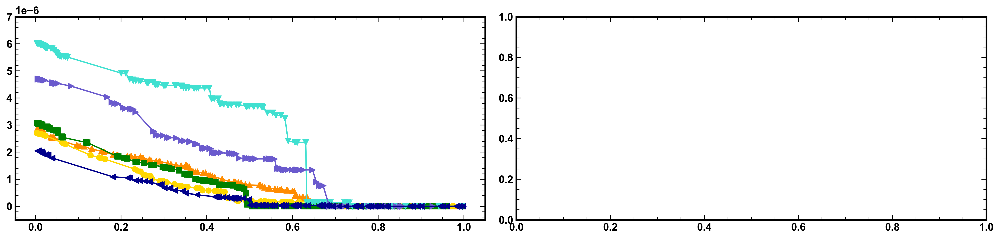

In [66]:
#plot absolute diffusivity curves
region_colors = ['darkorange','gold','green','turquoise','slateblue','darkblue']
region_shapes = ['^','o','s','v','>','<']

#pris
sample_color = 'k'
sample_num = 0

fig = plt.figure(figsize=(16, 4), dpi=400)
ax1 = fig.add_subplot(121)   
ax2 = fig.add_subplot(122)   


for r,region in enumerate(sat_tot[sample_num]):
    ax1.plot(region,diff_O2_mp[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], 
#              label = 'UF: {}'.format(UF_poro[1][sample_num][r])
            )
#     ax1.plot(region,perm_O2_list[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], markerfacecolor='none')
    
ax1.set_ylim([0.5*-10**-6,0.7*10**-5])


In [67]:
#just converting the single array elements to list so curve fitting works

perm_O2_list = []

for s,sample in enumerate(perm_O2):
    sample_temp  = []
    for r,region in enumerate(sample):
        region_temp = []
        for i, x in enumerate(region):
            region_temp.append(x[0])
        sample_temp.append(region_temp)
    perm_O2_list.append(sample_temp)
    
perm_water_list = []

for s,sample in enumerate(perm_water):
    sample_temp  = []
    for r,region in enumerate(sample):
        region_temp = []
        for i, x in enumerate(region):
            region_temp.append(x[0])
        sample_temp.append(region_temp)
    perm_water_list.append(sample_temp)

In [68]:
def rel_water(x,n,swir):
    y = []
    swor=1
    for i in x:
        y.append((np.heaviside((i-swir)/(swor-swir),0)*((i-swir)/(swor-swir)))**n)
    return y

In [69]:
def rel_gas(x, n,swor):
    swir=0
    y = []
    for i in x:
        y.append((np.heaviside(1-((i-swir)/(swor-swir)),0)*(1-((i-swir)/(swor-swir))))**n)
    return np.array(y)

In [70]:
#fitting modified Corey model to 

popt_perm_o2 = []
r_squared_perm_o2 = []
rmse_perm_o2 = []
x_perm_o2 = []
y_perm_o2 = []



#parameter guess [pris, uncomp, comp]
popt_guess = [[2,0.3],[2,0.3],[2,0.3]]

for s,sample in enumerate(perm_O2_list):
    sample_popt_perm_o2 = []
    sample_r_squared_perm_o2 = []
    sample_rmse_perm_o2 = []
    sample_x_perm_o2 = []
    sample_y_perm_o2 = []
        
    for r, region in enumerate(sample):
        popt_perm_o2_i, _ = curve_fit(rel_gas, sat_tot[s][r], region, p0=[2,0.3],bounds=([1,0],[10,1]))

        residuals_perm_o2 = region - rel_gas(sat_tot[s][r], *popt_perm_o2_i)
        ss_res = np.sum(residuals_perm_o2**2)
        ss_tot = np.sum((region-np.mean(region))**2)
        r_squared_i = 1 - (ss_res / ss_tot)
        
        rmse_perm_o2_i = np.sqrt(np.sum(residuals_perm_o2**2)/(len(residuals_perm_o2)-len(popt_perm_o2_i)))     
        
        x_perm_o2_i = np.linspace(0,1,len(residuals_perm_o2))
        y_perm_o2_i = np.array(rel_gas(x_perm_o2_i, *popt_perm_o2_i))
        
        print("popt: ",popt_perm_o2_i)
        print("R-squared:", r_squared_i)
        
        sample_popt_perm_o2.append(popt_perm_o2_i)
        sample_r_squared_perm_o2.append(r_squared_i)
        sample_rmse_perm_o2.append(rmse_perm_o2_i)
        sample_x_perm_o2.append(x_perm_o2_i)
        sample_y_perm_o2.append(y_perm_o2_i)
        
    popt_perm_o2.append(sample_popt_perm_o2)
    r_squared_perm_o2.append(sample_r_squared_perm_o2)
    rmse_perm_o2.append(sample_rmse_perm_o2)
    x_perm_o2.append(sample_x_perm_o2)
    y_perm_o2.append(sample_y_perm_o2)

popt:  [1.     0.7405]
R-squared: 0.9883698516217587
popt:  [2.3359 0.8023]
R-squared: 0.9969151180525582
popt:  [1.185  0.5789]
R-squared: 0.9550337817757019
popt:  [1.     0.9609]
R-squared: 0.7295187989422156
popt:  [1.    0.913]
R-squared: 0.9282954101269233
popt:  [10.      0.4371]
R-squared: 0.7475677177877786
popt:  [1.0221 0.7092]
R-squared: 0.9901708818415766
popt:  [3.3834 1.    ]
R-squared: 0.7208349273347381
popt:  [1.     0.8882]
R-squared: 0.9510843819938886
popt:  [1.     0.4119]
R-squared: 0.9473932550003297
popt:  [1.1254 0.7176]
R-squared: 0.9811271588897424
popt:  [1.     0.7749]
R-squared: 0.9731170360449206
popt:  [8.7288 1.    ]
R-squared: 0.7049477252861636
popt:  [2.0691 1.    ]
R-squared: 0.9683734037240344
popt:  [1.4213 0.4577]
R-squared: 0.988909869962682
popt:  [1.3723 0.2593]
R-squared: 0.9905641678665748
popt:  [1.     0.7047]
R-squared: 0.9333640661158774
popt:  [1.8175 0.812 ]
R-squared: 0.9905108344555702


In [71]:

popt_perm_water = []
r_squared_perm_water = []
rmse_perm_water = []
x_perm_water = []
y_perm_water = []



#parameter guess [pris, uncomp, comp]
popt_guess = [[2,0.3],[2,0.3],[2,0.3]]

for s,sample in enumerate(perm_water_list):
    sample_popt_perm_water = []
    sample_r_squared_perm_water = []
    sample_rmse_perm_water = []
    sample_x_perm_water = []
    sample_y_perm_water = []
        
    for r, region in enumerate(sample):
        popt_perm_i, _ = curve_fit(rel_water, sat_tot[s][r], region, p0=[3,0.4],bounds=([1,0],[100,1]))

        residuals_perm = np.array(region) - np.array(rel_water(sat_tot[s][r], *popt_perm_i))
        ss_res = np.sum(residuals_perm**2)
        ss_tot = np.sum((region-np.mean(region))**2)
        r_squared_i = 1 - (ss_res / ss_tot)
        
        rmse_perm_i = np.sqrt(np.sum(residuals_perm**2)/(len(residuals_perm)-len(popt_perm_i)))     
        
        x_perm_i = np.linspace(0,1,len(residuals_perm))
        y_perm_i = np.array(rel_water(x_perm_i, *popt_perm_i))
        
        print("popt: ",popt_perm_i)
        print("R-squared:", r_squared_i)
        
        sample_popt_perm_water.append(popt_perm_i)
        sample_r_squared_perm_water.append(r_squared_i)
        sample_rmse_perm_water.append(rmse_perm_i)
        sample_x_perm_water.append(x_perm_i)
        sample_y_perm_water.append(y_perm_i)
        
    popt_perm_water.append(sample_popt_perm_water)
    r_squared_perm_water.append(sample_r_squared_perm_water)
    rmse_perm_water.append(sample_rmse_perm_water)
    x_perm_water.append(sample_x_perm_water)
    y_perm_water.append(sample_y_perm_water)

popt:  [4.959e+00 1.526e-13]
R-squared: 0.9848232802739246
popt:  [4.1253e+00 4.5227e-18]
R-squared: 0.9941369025567973
popt:  [4.2530e+00 9.1618e-15]
R-squared: 0.9927375000334769
popt:  [9.7409e+00 9.8520e-14]
R-squared: 0.9613956188537051
popt:  [6.6992e+00 1.5630e-14]
R-squared: 0.8785748827469188
popt:  [4.1404e+00 6.3553e-22]
R-squared: 0.9727522204659448
popt:  [4.5884e+00 3.4803e-11]
R-squared: 0.9879784832734635
popt:  [1.9591 0.3785]
R-squared: 0.9883626490372786
popt:  [6.7451e+00 2.4798e-14]
R-squared: 0.9768991270423345
popt:  [4.8613e+00 9.9136e-13]
R-squared: 0.9423132567704197
popt:  [6.5501e+00 2.6663e-16]
R-squared: 0.9687711638388437
popt:  [5.9255e+00 2.4673e-16]
R-squared: 0.9790092940554483
popt:  [3.2469 0.2682]
R-squared: 0.9958887343954809
popt:  [2.1857 0.408 ]
R-squared: 0.9882688382290108
popt:  [4.3708e+00 5.1235e-15]
R-squared: 0.9195268559574674
popt:  [1.1924 0.5554]
R-squared: 0.9937958979498728
popt:  [1.5738e+01 8.6308e-11]
R-squared: 0.86726116251913

In [72]:
print(r_squared_perm_o2[0])

[0.9883698516217587, 0.9969151180525582, 0.9550337817757019, 0.7295187989422156, 0.9282954101269233, 0.7475677177877786]


In [73]:
#averaging values across regions for each sample

ng_avg = []
swor_avg = []

nw_avg = []
swir_avg = []

water_r2 = []
o2_r2 = []


for s,sample in enumerate(popt_perm_o2):
    ng_avg.append(np.average(np.array(sample),axis=0)[0])
    swor_avg.append(np.average(np.array(sample),axis=0)[1])
    o2_r2.append(np.average(r_squared_perm_o2[s]))


    nw_avg.append(np.average(np.array(popt_perm_water[s]),axis=0)[0])
    swir_avg.append(np.average(np.array(popt_perm_water[s]),axis=0)[1])
    water_r2.append(np.average(r_squared_perm_water[s]))


print('Ng average: ',ng_avg)
print('Swor average: ',swor_avg)
print('R2 average: ',o2_r2)
print('Nw average: ',nw_avg)
print('Swir average: ', swir_avg)
print('R2 average: ',water_r2)


Ng average:  [2.753498059326288, 1.4218060553441623, 2.734838115522439]
Swor average:  [0.7387888036279437, 0.750281399508896, 0.7056281102212903]
R2 average:  [0.890950113051156, 0.9272879401841992, 0.9294450112351504]
Nw average:  [5.652960128090048, 5.104934797898337, 4.897974697288558]
Swir average:  [4.5985342079772796e-14, 0.06308952539564174, 0.2788783092839009]
R2 average:  [0.9640700674884614, 0.9738889956696313, 0.9588007319862916]


In [81]:
print(popt_perm_o2[0][0][1])
print(perm_water_list)

0.7404798925844158
[[[9.999999999999625e-07, 1.00000003099954e-06, 1.00000003099954e-06, 1.000000033206329e-06, 1.000000033206329e-06, 1.0000496640298496e-06, 1.0001584291742119e-06, 1.0001584291742119e-06, 1.0004055173007765e-06, 1.0004982275536667e-06, 1.0015427758023815e-06, 1.001859146609808e-06, 1.0018743076059822e-06, 1.0033414606081227e-06, 1.0034851236780242e-06, 1.0106210925110092e-06, 1.0106210925110092e-06, 1.0108796705219668e-06, 1.0108796705219668e-06, 1.0161116487165139e-06, 1.0168987129704496e-06, 1.0170277841284942e-06, 1.1376621114781677e-06, 1.1408374812025079e-06, 1.1408635427731423e-06, 1.1483138279369272e-06, 1.1524605665145444e-06, 1.1524725595149218e-06, 1.1524725595149218e-06, 1.1524924402310313e-06, 1.7827701940480138e-06, 1.7852582119413948e-06, 1.7853025609579236e-06, 1.8127637537309936e-06, 5.496458134973717e-05, 5.5073646463663606e-05, 5.6053241336793e-05, 5.6093502240089266e-05, 0.00012119164841719193, 0.0008033524692477031, 0.0008033666469874921, 0.000811

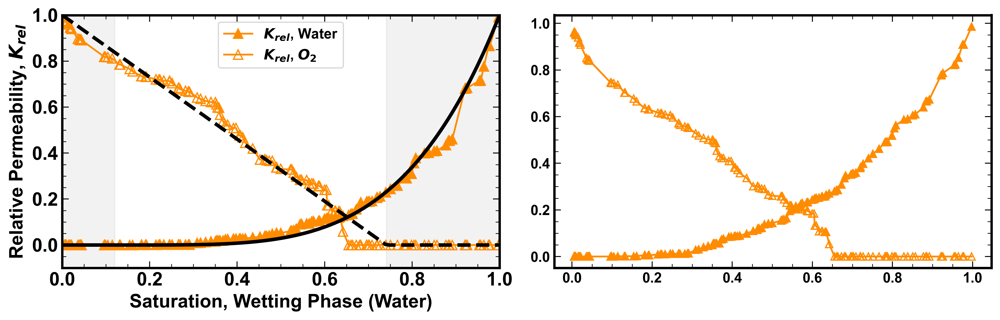

In [76]:
#plot relative permeability curves
region_colors = ['darkorange','gold','green','turquoise','slateblue','darkblue']
region_shapes = ['^','o','s','v','>','<']

#pris
sample_color = 'k'
sample_num = 0

fig = plt.figure(figsize=(12, 4), dpi=400)
ax1 = fig.add_subplot(121)   
ax2 = fig.add_subplot(122)   



for r,region in enumerate(sat_tot[sample_num]):
    if r==0:
        ax1.plot(region,perm_water_list[sample_num][r],color=region_colors[r],markersize=8,linestyle='-',marker=region_shapes[r], 
                 label = '$K_{rel}$, Water')
        ax1.plot(region,perm_O2_list[sample_num][r],color=region_colors[r],markersize=8,linestyle='-',marker=region_shapes[r], markerfacecolor='none',
                label = '$K_{rel}$, $O_2$')
    if r==0:
        ax2.plot(region,diff_water[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], 
#                  label = 'UF: {}'.format(UF_poro[1][sample_num][r])
                )
        ax2.plot(region,diff_O2[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], markerfacecolor='none')

p2, = ax1.plot(x_perm_o2_i, rel_gas(x_perm_o2_i, 1,   0.7413), color = sample_color, linestyle = '--', marker = '', markerfacecolor='none', 
               linewidth=3,alpha=1, zorder=99)
p1, = ax1.plot(x_perm_i, rel_water(x_perm_i, 4.2e+00, 0.12), color = sample_color, linestyle = '-', marker = '', markerfacecolor='none', 
               linewidth=3,alpha=1, zorder=99)

# ax1.axvspan(0,swir_avg[sample_num],alpha=0.05,color=sample_color)
# ax1.axvspan(swor_avg[sample_num],1,alpha=0.05,color=sample_color)

ax1.axvspan(0,0.12,alpha=0.05,color=sample_color)
ax1.axvspan(0.7413,1,alpha=0.05,color=sample_color)


lgd2 = ax1.legend(loc='upper center')

ax1.set_ylabel(r'Relative Permeability, $K_{rel}$', fontsize=16)
ax1.set_xlabel("Saturation, Wetting Phase (Water)", fontsize=16)
ax1.set_ylim([-0.1,1])
ax1.set_xlim([0,1])
ax1.spines['right'].set_color('black')
ax1.spines['left'].set_color('black')
ax1.spines['bottom'].set_color('black')
ax1.spines['top'].set_color('black')

ax1.tick_params(axis='x', colors='black',labelsize=16)
ax1.tick_params(axis='y', colors='black',labelsize=16)

#     ax1.grid()
# lgd1 = ax1.legend([p1, p2],
#                   ["$K_{rel}$, Water", "$K_{rel}$, $O_2$"], 
#                   loc='upper center')

plt.savefig('relPermeabilty_pris.png',\
                transparent = True, dpi = 400, bbox_inches='tight')


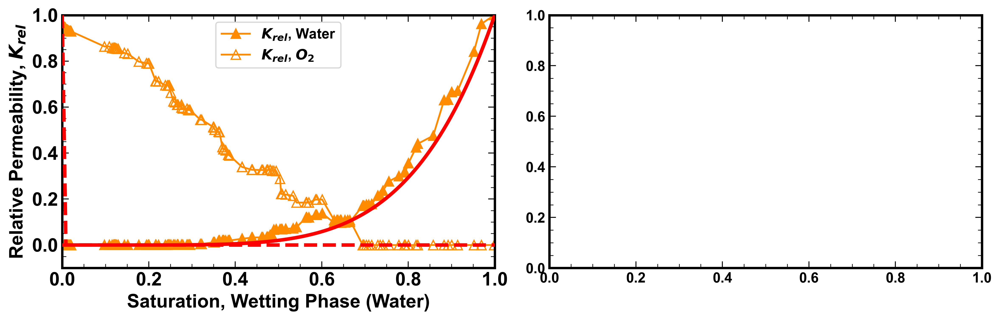

In [77]:
#plot relative permeability curves
region_colors = ['darkorange','gold','green','turquoise','slateblue','darkblue']
region_shapes = ['^','o','s','v','>','<']


#uncomp
sample_color = 'r'
sample_num = 1

fig = plt.figure(figsize=(12, 4), dpi=400)
ax1 = fig.add_subplot(121)   
ax2 = fig.add_subplot(122)   



for r,region in enumerate(sat_tot[sample_num]):
    if r==0:
        ax1.plot(region,perm_water_list[sample_num][r],color=region_colors[r],linestyle='-',markersize=8,
                 label = '$K_{rel}$, Water',marker=region_shapes[r])
        ax1.plot(region,perm_O2_list[sample_num][r],color=region_colors[r],linestyle='-',markersize=8,
                 label= '$K_{rel}$, $O_2$',marker=region_shapes[r], markerfacecolor='none')
    
#     ax2.plot(region,diff_water[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], label = 'UF: {}'.format(UF_poro[1][sample_num][r]))
#     ax2.plot(region,diff_O2[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], markerfacecolor='none')
    
p2, = ax1.plot(x_perm_o2_i, rel_gas(x_perm_o2_i, 4.6151e+00, 3.3378e-13), color = sample_color, linestyle = '--', marker = '', markerfacecolor='none', 
               linewidth=3,alpha=1, zorder=99)
p1, = ax1.plot(x_perm_i, rel_water(x_perm_i, nw_avg[sample_num],swir_avg[sample_num]), color = sample_color, linestyle = '-', marker = '', markerfacecolor='none', 
               linewidth=3,alpha=1, zorder=99)
lgd2 = ax1.legend(loc='upper center')

# ax1.axvspan(0,swir_avg[sample_num],alpha=0.05,color=sample_color)
# ax1.axvspan(swor_avg[sample_num],1,alpha=0.05,color=sample_color)

ax1.set_ylabel(r'Relative Permeability, $K_{rel}$', fontsize=16)
ax1.set_xlabel("Saturation, Wetting Phase (Water)",fontsize=16)
ax1.set_ylim([-0.1,1])
ax1.set_xlim([0,1])
# ax1.spines['right'].set_color('r')
# ax1.spines['left'].set_color('r')
# ax1.spines['bottom'].set_color('r')
# ax1.spines['top'].set_color('r')
ax1.tick_params(axis='x', colors='black',labelsize=16)
ax1.tick_params(axis='y', colors='black',labelsize=16)
ax1.yaxis.label.set_color('black')
ax1.xaxis.label.set_color('black')
#     ax1.grid()
# lgd1 = ax1.legend([p1, p2],
#                   ["$K_{rel}$, Water", "$K_{rel}$, $O_2$"], 
#                   loc='upper center')

plt.savefig('relPermeabilty_uncomp.png',\
                transparent = True, dpi = 400, bbox_inches='tight')


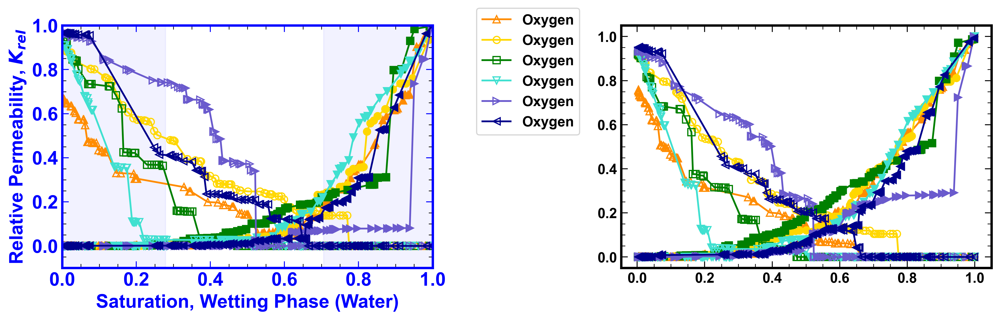

In [79]:
#plot relative permeability curves
region_colors = ['darkorange','gold','green','turquoise','slateblue','darkblue']
region_shapes = ['^','o','s','v','>','<']

#comp
sample_color = 'b'
sample_num = 2

fig = plt.figure(figsize=(12, 4), dpi=400)
ax1 = fig.add_subplot(121)   
ax2 = fig.add_subplot(122)   


for r,region in enumerate(sat_tot[sample_num]):
    ax1.plot(region,perm_water_list[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r],
#              label = 'Water'
            )
    ax1.plot(region,perm_O2_list[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], markerfacecolor='none',
            
            label = 'Oxygen'
            )
    ax2.plot(region,diff_water[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], 
#              label = 'UF: {}'.format(UF_poro[1][sample_num][r])
            )
    ax2.plot(region,diff_O2[sample_num][r],color=region_colors[r],linestyle='-',marker=region_shapes[r], markerfacecolor='none')
    
# p2, = ax1.plot(x_perm_o2_i, rel_gas(x_perm_o2_i, ng_avg[sample_num],swor_avg[sample_num]), color = sample_color, linestyle = '--', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)
# p1, = ax1.plot(x_perm_i, rel_water(x_perm_i, nw_avg[sample_num],swir_avg[sample_num]), color = sample_color, linestyle = '-', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)
lgd1 = ax1.legend(bbox_to_anchor=(1.1,1.1))


ax1.axvspan(0,swir_avg[sample_num],alpha=0.05,color=sample_color)
ax1.axvspan(swor_avg[sample_num],1,alpha=0.05,color=sample_color)

ax1.set_ylabel(r'Relative Permeability, $K_{rel}$',fontsize=16)
ax1.set_xlabel("Saturation, Wetting Phase (Water)",fontsize=16)
ax1.set_ylim([-0.1,1])
ax1.set_xlim([0,1])
ax1.spines['right'].set_color('b')
ax1.spines['left'].set_color('b')
ax1.spines['bottom'].set_color('b')
ax1.spines['top'].set_color('b')
ax1.tick_params(axis='x', colors='b', labelsize=16)
ax1.tick_params(axis='y', colors='b',labelsize=16)
ax1.yaxis.label.set_color('b')
ax1.xaxis.label.set_color('b')
#     ax1.grid()
# lgd1 = ax1.legend([p1, p2],
#                   ["$K_{rel}$, Water", "$K_{rel}$, $O_2$"], 
#                   loc='upper center')

plt.savefig('relPermeabilty_comp.png',\
                transparent = True, dpi = 400, bbox_inches='tight')



## Diffusivity

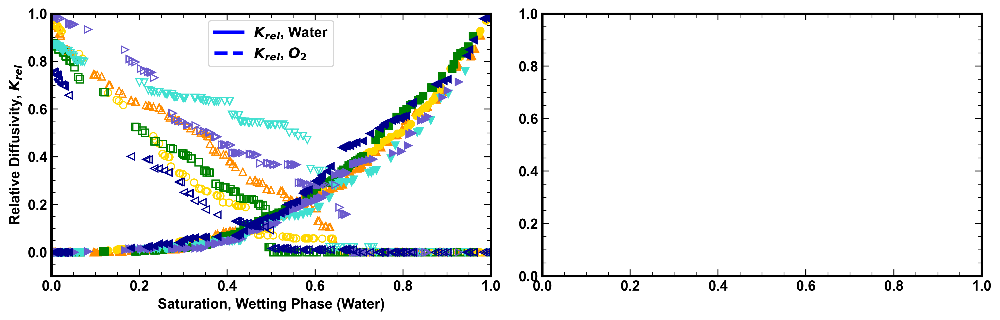

In [114]:
#plot relative diffusivity curves
region_colors = ['darkorange','gold','green','turquoise','slateblue','darkblue']
region_shapes = ['^','o','s','v','>','<']

#pris
sample_color = 'k'
sample_num = 0

fig = plt.figure(figsize=(12, 4), dpi=400)
ax1 = fig.add_subplot(121)   
ax2 = fig.add_subplot(122)   



for r,region in enumerate(sat_tot[sample_num]):
    ax1.plot(region,diff_water[sample_num][r],color=region_colors[r],linestyle='',marker=region_shapes[r])
    ax1.plot(region,diff_O2[sample_num][r],color=region_colors[r],linestyle='',marker=region_shapes[r], markerfacecolor='none')
    
# p2, = ax1.plot(x_perm_o2_i, rel_gas(x_perm_o2_i, ng_avg[sample_num],swor_avg[sample_num]), color = sample_color, linestyle = '--', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)
# p1, = ax1.plot(x_perm_i, rel_water(x_perm_i, nw_avg[sample_num],swir_avg[sample_num]), color = sample_color, linestyle = '-', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)

# ax1.axvspan(0,swir_avg[sample_num],alpha=0.05,color=sample_color)
# ax1.axvspan(swor_avg[sample_num],1,alpha=0.05,color=sample_color)

ax1.set_ylabel(r'Relative Diffusivity, $K_{rel}$')
ax1.set_xlabel("Saturation, Wetting Phase (Water)")
ax1.set_ylim([-0.1,1])
ax1.set_xlim([0,1])
#     ax1.grid()
lgd1 = ax1.legend([p1, p2],
                  ["$K_{rel}$, Water", "$K_{rel}$, $O_2$"], 
                  loc='upper center')

plt.savefig('relDiffusivity_pris.png',\
                transparent = True, dpi = 400, bbox_inches='tight')


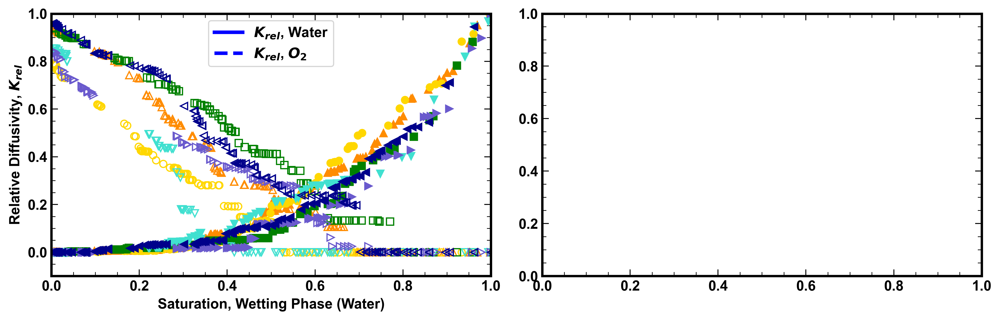

In [115]:
region_colors = ['darkorange','gold','green','turquoise','slateblue','darkblue']
region_shapes = ['^','o','s','v','>','<']

#uncomp
sample_color = 'r'
sample_num = 1

fig = plt.figure(figsize=(12, 4), dpi=400)
ax1 = fig.add_subplot(121)   
ax2 = fig.add_subplot(122)   



for r,region in enumerate(sat_tot[sample_num]):
    ax1.plot(region,diff_water[sample_num][r],color=region_colors[r],linestyle='',marker=region_shapes[r])
    ax1.plot(region,diff_O2[sample_num][r],color=region_colors[r],linestyle='',marker=region_shapes[r], markerfacecolor='none')
    
# p2, = ax1.plot(x_perm_o2_i, rel_gas(x_perm_o2_i, ng_avg[sample_num],swor_avg[sample_num]), color = sample_color, linestyle = '--', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)
# p1, = ax1.plot(x_perm_i, rel_water(x_perm_i, nw_avg[sample_num],swir_avg[sample_num]), color = sample_color, linestyle = '-', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)

# ax1.axvspan(0,swir_avg[sample_num],alpha=0.05,color=sample_color)
# ax1.axvspan(swor_avg[sample_num],1,alpha=0.05,color=sample_color)

ax1.set_ylabel(r'Relative Diffusivity, $K_{rel}$')
ax1.set_xlabel("Saturation, Wetting Phase (Water)")
ax1.set_ylim([-0.1,1])
ax1.set_xlim([0,1])
#     ax1.grid()
lgd1 = ax1.legend([p1, p2],
                  ["$K_{rel}$, Water", "$K_{rel}$, $O_2$"], 
                  loc='upper center')

plt.savefig('relDiffusivity_uncomp.png',\
                transparent = True, dpi = 400, bbox_inches='tight')


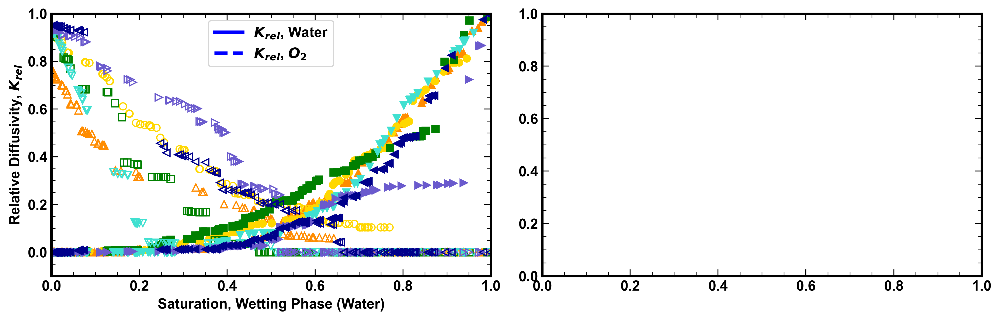

In [116]:
region_colors = ['darkorange','gold','green','turquoise','slateblue','darkblue']
region_shapes = ['^','o','s','v','>','<']

#comp
sample_color = 'b'
sample_num = 2

fig = plt.figure(figsize=(12, 4), dpi=400)
ax1 = fig.add_subplot(121)   
ax2 = fig.add_subplot(122)   



for r,region in enumerate(sat_tot[sample_num]):
    ax1.plot(region,diff_water[sample_num][r],color=region_colors[r],linestyle='',marker=region_shapes[r])
    ax1.plot(region,diff_O2[sample_num][r],color=region_colors[r],linestyle='',marker=region_shapes[r], markerfacecolor='none')
    
# p2, = ax1.plot(x_perm_o2_i, rel_gas(x_perm_o2_i, ng_avg[sample_num],swor_avg[sample_num]), color = sample_color, linestyle = '--', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)
# p1, = ax1.plot(x_perm_i, rel_water(x_perm_i, nw_avg[sample_num],swir_avg[sample_num]), color = sample_color, linestyle = '-', marker = '', markerfacecolor='none', 
#                linewidth=3,alpha=1, zorder=99)

# ax1.axvspan(0,swir_avg[sample_num],alpha=0.05,color=sample_color)
# ax1.axvspan(swor_avg[sample_num],1,alpha=0.05,color=sample_color)

ax1.set_ylabel(r'Relative Diffusivity, $K_{rel}$')
ax1.set_xlabel("Saturation, Wetting Phase (Water)")
ax1.set_ylim([-0.1,1])
ax1.set_xlim([0,1])
#     ax1.grid()
lgd1 = ax1.legend([p1, p2],
                  ["$K_{rel}$, Water", "$K_{rel}$, $O_2$"], 
                  loc='upper center')

plt.savefig('relDiffusivity_comp.png',\
                transparent = True, dpi = 400, bbox_inches='tight')
